<a href="https://colab.research.google.com/github/UCLM-LoUISE/TFG2022-LopezBermejo/blob/main/TFG_DenseNet_Inception.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inicialización

In [ ]:
!pip install tensorflow-gpu==2.8.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 497.9 MB 31 kB/s 
     |████████████████████████████████| 5.8 MB 70.9 MB/s 
     |████████████████████████████████| 1.4 MB 63.7 MB/s 
     |████████████████████████████████| 462 kB 76.5 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of th

In [ ]:
!pip install tensorflow-addons
!pip install keras-tuner -q

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 14.9 MB/s 
     |████████████████████████████████| 135 kB 15.5 MB/s 
     |████████████████████████████████| 1.6 MB 60.4 MB/s 


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import tensorflow_datasets as tfds
import pandas as pd

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.losses import categorical_crossentropy, sparse_categorical_crossentropy
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

import tensorflow_addons as tfa
import keras_tuner
import keras.backend as K

# Para matriz de confusion
%matplotlib inline
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
import pandas as pd

# Para curvas ROC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score

# Para dataset
from sklearn.model_selection import train_test_split


import gc
import keras.backend as K

from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			



In [ ]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1,10,figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def set_seed(seed=31415):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed()

def predict_images(model):
  predictions = model.predict(imgs[:10])
  predictions = np.argmax(model.predict(imgs[:10]), axis=-1)
  label_predictions = []
  for prediction in predictions:
    label_predictions.append(class_names[prediction])
  print(label_predictions)
  plotImages(imgs[:10])

def print_metrics(history):
  # plt.figure(figsize=(30, 30))
  plt.rcParams['figure.figsize'] = [12, 7]
  history_frame = pd.DataFrame(history)
  history_frame.loc[:, ['f1_macro', 'val_f1_macro']].plot()
  plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(1))
  plt.ylabel('F1', fontsize = 15)
  plt.xlabel('Epoch', fontsize = 15)
  plt.legend(['Validación', 'Entrenamiento'],loc='lower right' ,fontsize=15)
  plt.xticks(fontsize = 15)
  plt.yticks([0,0.2,0.4,0.6,0.8,1], fontsize = 15)
  plt.show()



def print_confusion(model, X_test, Y_test):
  y_true = np.array([int(np.where(y==1)[0]) for y in Y_test])
  y_pred = np.argmax(model.predict(X_test), axis=-1)


  con_mat = tf.math.confusion_matrix(labels=y_true, predictions=y_pred).numpy()
  con_mat_norm = np.around(con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis], decimals=2)
  con_mat_df = pd.DataFrame(con_mat_norm,
                      index = class_names, 
                      columns = class_names)

  figure = plt.figure(figsize=(9, 9))
  res = sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues, annot_kws={"size": 15}, linewidths=0.3)
  res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 15)
  res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 15)
  plt.tight_layout()
  plt.ylabel('Clase real', fontsize = 15, color='green')
  plt.xlabel('Clase predicha', fontsize = 15, color='red')
  plt.show()


def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val




def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def recall_macro(y_true, y_pred):
     recall = 0
     pred = K.argmax(y_pred)
     true = K.argmax(y_true)
     for i in range(7):
         p = K.cast(K.equal(pred,i),'float32')
         t = K.cast(K.equal(true,i),'float32')
    #      # Compute the true positive
         common = K.sum(K.dot(K.reshape(t,(1,-1)),K.reshape(p,(-1,1))))
    #      # divide by all positives in t
        #  recall += common/(tf.constant(K.sum(t), dtype=tf.float32) + tf.constant(K.epsilon(), dtype=tf.float32))
         recall += float(common)/(float(K.sum(t)) + K.epsilon())
        #  recall = float(recall)
        #  recall += common/ (K.sum(t) + K.epsilon)
     return recall/7

def precision_macro(y_true, y_pred):
     precision = 0
     pred = K.argmax(y_pred)
     true = K.argmax(y_true)
     for i in range(7):
         p = K.cast(K.equal(pred,i),'float32')
         t = K.cast(K.equal(true,i),'float32')
    #      # Compute the true positive
         common = K.sum(K.dot(K.reshape(t,(1,-1)),K.reshape(p,(-1,1))))
    #      # divide by all positives in t
        #  recall += common/(tf.constant(K.sum(t), dtype=tf.float32) + tf.constant(K.epsilon(), dtype=tf.float32))
         precision += float(common)/(float(K.sum(p)) + K.epsilon())
        #  recall = float(recall)
        #  recall += common/ (K.sum(t) + K.epsilon)
     return precision/7

def f1_macro(y_true, y_pred):
     recall = 0
     precision = 0
     f1 = 0
     pred = K.argmax(y_pred) # Codificación integer [4,6,1,0]
     true = K.argmax(y_true) 
     for i in range(7):
         p = K.cast(K.equal(pred,i),'float32') # Vemos si el array de predicciones es igual a cada una de las clases
         t = K.cast(K.equal(true,i),'float32') # Vemos si el array true es igual a cada una de las clases
         # Compute the true positive
         common = K.sum(K.dot(K.reshape(t,(1,-1)),K.reshape(p,(-1,1)))) # TP

         recall = float(common)/(float(K.sum(t)) + K.epsilon()) # Sumamos Recall de la clase
         precision = float(common)/(float(K.sum(p)) + K.epsilon())
         f1 += 2*(precision*recall)/(precision+recall+K.epsilon())

     return f1/7

# function for scoring roc auc score for multi-class
def plot_multiclass_roc_auc_score(model, x, y, average="micro"):
    test_pred_raw = model.predict(x)
    y_pred = np.argmax(test_pred_raw, axis=1)
    y_test = np.argmax(y, axis=1)
    fig, c_ax = plt.subplots(1,1, figsize = (12, 8))
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(class_names):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')
    print('ROC AUC score:', roc_auc_score(y_test, y_pred, average=average))
    c_ax.legend()
    c_ax.set_xlabel('False Positive Rate', fontsize=15, color = 'red')
    c_ax.set_ylabel('True Positive Rate', fontsize=15, color = 'green')
    plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1], fontsize=15)
    plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1], fontsize=15)
    plt.rc('axes',  labelsize=15)
    plt.rc('legend', fontsize=15)
    plt.show()

class ClearRam(tf.keras.callbacks.Callback):
  def on_train_end(self, logs=None):
    gc.collect()

In [ ]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("GPUs Available: ", len(physical_devices))
tf.config.experimental.set_memory_growth(physical_devices[0], True)

GPUs Available:  1


In [ ]:
if not(os.path.isdir('/content/train')):
  from google.colab import drive
  drive.mount('/content/drive')
  !cp '/content/drive/MyDrive/kaggle.json' .
  !pip install kaggle
  !mkdir ~/.kaggle
  !cp kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json
  !kaggle datasets download msambare/fer2013
  !unzip fer2013.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: train/sad/Training_65242339.jpg  
  inflating: train/sad/Training_65267116.jpg  
  inflating: train/sad/Training_65275626.jpg  
  inflating: train/sad/Training_6529266.jpg  
  inflating: train/sad/Training_65329617.jpg  
  inflating: train/sad/Training_65338712.jpg  
  inflating: train/sad/Training_65338797.jpg  
  inflating: train/sad/Training_65387162.jpg  
  inflating: train/sad/Training_65404494.jpg  
  inflating: train/sad/Training_65426218.jpg  
  inflating: train/sad/Training_65430136.jpg  
  inflating: train/sad/Training_65437377.jpg  
  inflating: train/sad/Training_6545735.jpg  
  inflating: train/sad/Training_65463385.jpg  
  inflating: train/sad/Training_65473985.jpg  
  inflating: train/sad/Training_65502829.jpg  
  inflating: train/sad/Training_65505359.jpg  
  inflating: train/sad/Training_65508578.jpg  
  inflating: train/sad/Training_65516023.jpg  
  inflating: train/sad/Training_65524027.jpg  
 

In [ ]:
img_height = 48
img_width = 48

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
os.environ['TF_DETERMINISTIC_OPS'] = '1'

In [ ]:
batch_size = 1

In [ ]:
ds_1 = tf.keras.utils.image_dataset_from_directory(
  '/content/train',
  color_mode = 'rgb',
  label_mode = 'int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 28709 files belonging to 7 classes.


In [ ]:
ds_2 = tf.keras.utils.image_dataset_from_directory(
  '/content/test',
  color_mode = 'rgb',
  label_mode = 'int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 7178 files belonging to 7 classes.


In [ ]:
X_1 = []
X_2 = []
Y_1 = []
Y_2 = []


for imgs, labels in ds_1:
  for img in imgs:
    X_1.append(img)
  for label in labels:
    Y_1.append(label)

for imgs, labels in ds_2:
  for img in imgs:
    X_2.append(img)
  for label in labels:
    Y_2.append(label)
  
X_1 = np.array(X_1).astype(float)/255
X_2 = np.array(X_2).astype(float)/255

Y_1 = np.array(Y_1)
Y_2 = np.array(Y_2)



In [ ]:
X = np.concatenate((X_1, X_2), axis=0)

In [ ]:
Y = np.concatenate((Y_1, Y_2), axis=0)

In [ ]:
len(X)

35887

In [ ]:
len(Y)

35887

In [ ]:
train_ratio = 0.70
test_ratio = 0.20
validation_ratio = 0.10

In [ ]:
X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, Y, test_size=test_ratio)

X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=validation_ratio/(train_ratio+validation_ratio))


In [ ]:
Y_train = keras.utils.to_categorical(Y_train, dtype ="uint8", num_classes = 7)
Y_val = keras.utils.to_categorical(Y_val, dtype ="uint8", num_classes = 7)

In [ ]:
X_train_testing = X_train_val
X_test_testing = X_test
Y_train_testing = keras.utils.to_categorical(Y_train_val, dtype ="uint8", num_classes = 7)
Y_test_testing = keras.utils.to_categorical(Y_test, dtype ="uint8", num_classes = 7)

In [ ]:
print("Training: ", X_train.shape)
print("Validation: ", X_val.shape)
print("Test: ", X_test.shape)

Training:  (25120, 48, 48, 3)
Validation:  (3589, 48, 48, 3)
Test:  (7178, 48, 48, 3)


In [ ]:
class_names = ds_1.class_names
print(class_names)
num_classes = len(class_names)
print(num_classes)

['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
7


In [ ]:
class ClearRam(tf.keras.callbacks.Callback):
  def on_train_end(self, logs=None):
    gc.collect()

# DenseNet

In [ ]:
model = tf.keras.applications.DenseNet121(
    include_top=True,
    weights=None,
    input_tensor=None,
    input_shape=None,
    pooling=None,
)

In [ ]:
model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                        

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.540754 to fit



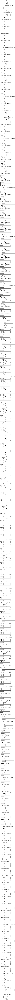

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False
)

#### Búsqueda bayesiana

* Versión: DenseNet50, DenseNet169, DenseNe201
* Optimizer: Adam, SGD
* Learning_rate: 0.001, 0.0001, 0.00001
* Data augmentation: True, False

In [ ]:
# !rm -rf /content/drive/MyDrive/Tensorflow/DenseNet_tuning_bayesian/tb
# !rm -rf /content/drive/MyDrive/Tensorflow/DenseNet_tuning_bayesian/tb_logs

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def DenseNet_version(version):

  if (version == 'DenseNet121'):
    base_model = keras.applications.DenseNet121(
              weights='imagenet',  # Pesos preentrenados de ImageNet.
              include_top=False,
              )
    return base_model

  if (version == 'DenseNet169'):
    base_model = keras.applications.DenseNet169(
                weights='imagenet',  # Pesos preentrenados de ImageNet.
                include_top=False)
    return base_model

  if (version == 'DenseNet201'):
    base_model = keras.applications.DenseNet201(
                weights='imagenet',  # Pesos preentrenados de ImageNet.
                include_top=False)
    return base_model 
  

def opti(optimizer, learning_rate):

  if (optimizer=="Adam"):
    return keras.optimizers.Adam(learning_rate)
  if (optimizer=="SGD"):
    return keras.optimizers.SGD(learning_rate)


def RandomFlip():
  return tf.keras.layers.RandomFlip(mode="horizontal")

def RandomTranslation(factor):
  return tf.keras.layers.RandomTranslation(
                          height_factor = factor,
                          width_factor = factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )

def RandomZoom(factor):
  return tf.keras.layers.RandomZoom(
                          height_factor=factor,
                          width_factor=factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )
def RandomRotation(factor):
  return tf.keras.layers.RandomRotation(
                          factor = factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )


  
def DataAugmentation(factor):
  return Sequential([RandomFlip(),
                    RandomZoom(factor-0.10),
                    RandomTranslation(factor-0.18),
                    RandomRotation(factor-0.23)
                    ])
  

In [ ]:
class CustomBayesian(keras_tuner.BayesianOptimization):
  def run_trial(self, trial, *args, **kwargs):
    # You can add additional HyperParameters for preprocessing and custom training loops
    # via overriding `run_trial`
    kwargs['batch_size'] = trial.hyperparameters.Choice("batch_size", [32, 64, 128, 256])
    kwargs['callbacks'] = [early_stopping, keras.callbacks.TensorBoard("/content/drive/MyDrive/Tensorflow/DenseNet_tuning_bayesian/tb_logs")]
    return super(CustomBayesian, self).run_trial(trial, *args, **kwargs)

In [ ]:
class MyHyperModel(keras_tuner.HyperModel):
    def build(self, hp):
    
      version = hp.Choice("version", ['DenseNet121', 'DenseNet169', 'DenseNet201'])
      optimizer = hp.Choice("optimizer", ["Adam", "SGD"])
      learning_rate = hp.Choice("learning_rate", [0.01, 0.001, 0.0001])
      augmentation = hp.Boolean("augmentation")

      base_model = DenseNet_version(version)
      model = keras.Sequential()
      model.add(tf.keras.Input(shape=(img_width, img_height, 3)))
      if (augmentation):
        model.add(DataAugmentation(0.25))
      model.add(base_model)
      model.add(layers.GlobalAveragePooling2D())
      model.add(layers.Dense(num_classes, activation="softmax"))

      # Compile the model.
      model.compile(
          optimizer=opti(optimizer, learning_rate),
          loss="categorical_crossentropy",
          metrics=['accuracy', recall_macro, precision_macro, f1_macro],
      )
      return model

    def fit(self, hp, model, *args, **kwargs):
        
        return model.fit(
            *args,
            **kwargs,
        )


In [ ]:
tuner = CustomBayesian(
    hypermodel = MyHyperModel(),
    max_trials=30,
    executions_per_trial=1,
    # Do not resume the previous search in the same directory.
    overwrite=False,
    objective=keras_tuner.Objective("val_f1_macro", direction="max"),
    # Set a directory to store the intermediate results.
    directory="/content/drive/MyDrive/Tensorflow/DenseNet_tuning_bayesian/tb",
    project_name="DenseNet",
    beta=16
)

29097984/29084464 [==============================] - 0s 0us/step


In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 5
version (Choice)
{'default': 'DenseNet121', 'conditions': [], 'values': ['DenseNet121', 'DenseNet169', 'DenseNet201'], 'ordered': False}
optimizer (Choice)
{'default': 'Adam', 'conditions': [], 'values': ['Adam', 'SGD'], 'ordered': False}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}
augmentation (Boolean)
{'default': False, 'conditions': []}
batch_size (Choice)
{'default': 32, 'conditions': [], 'values': [32, 64, 128, 256], 'ordered': True}


In [ ]:
tuner.search(
  X_train,
  Y_train,
  validation_data=(X_val, Y_val),
  epochs=500,
)

In [ ]:
tuner.results_summary(num_trials=20)

Results summary
Results in /content/drive/MyDrive/Tensorflow/DenseNet_tuning_bayesian/tb/DenseNet
Showing 20 best trials
Trial summary
Hyperparameters:
version: DenseNet201
optimizer: Adam
learning_rate: 0.0001
augmentation: False
batch_size: 256
Score: 0.5636438727378845
Trial summary
Hyperparameters:
version: DenseNet201
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256
Score: 0.5421620011329651
Trial summary
Hyperparameters:
version: DenseNet121
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256
Score: 0.538043200969696
Trial summary
Hyperparameters:
version: DenseNet121
optimizer: Adam
learning_rate: 0.0001
augmentation: False
batch_size: 256
Score: 0.5371685028076172
Trial summary
Hyperparameters:
version: DenseNet121
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 32
Score: 0.536824643611908
Trial summary
Hyperparameters:
version: DenseNet121
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256


## Mejor modelo 1

* DenseNet201
* Adam
* 0.0001
* False
* 256

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=5)[0]
best_hp.values

{'version': 'DenseNet201',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': False,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=5)[0]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/DenseNet_checkpoints'

rm: cannot remove '/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/tensorboard_logs': No such file or directory
rm: cannot remove '/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/DenseNet_checkpoints': No such file or directory


In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/DenseNet_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=2)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):
	while(min_accuracy < 0.26):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)
	
		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()

	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/DenseNet_averaged1/best_model')
		best_model_id = i
		
	metrics.append(history)
	
 
print(best_model_id)

0
74850304/74836368 [==============================] - 1s 0us/step
Epoch 1/500
99/99 [==============================] - 53s 283ms/step - loss: 1.5931 - accuracy: 0.3889 - recall_macro: 0.3157 - precision_macro: 0.3291 - f1_macro: 0.3061 - val_loss: 1.5859 - val_accuracy: 0.3923 - val_recall_macro: 0.2939 - val_precision_macro: 0.3290 - val_f1_macro: 0.2332
Epoch 2/500
99/99 [==============================] - 23s 236ms/step - loss: 1.0373 - accuracy: 0.6234 - recall_macro: 0.5455 - precision_macro: 0.5837 - f1_macro: 0.5492 - val_loss: 1.4590 - val_accuracy: 0.4313 - val_recall_macro: 0.3387 - val_precision_macro: 0.3616 - val_f1_macro: 0.3045
Epoch 3/500
99/99 [==============================] - 23s 236ms/step - loss: 0.5861 - accuracy: 0.8172 - recall_macro: 0.7623 - precision_macro: 0.8134 - f1_macro: 0.7749 - val_loss: 1.4713 - val_accuracy: 0.4433 - val_recall_macro: 0.3324 - val_precision_macro: 0.3654 - val_f1_macro: 0.3103
Epoch 4/500
99/99 [==============================] - 23s 

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(8):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

print(acc_list)
acc_avg = sum(acc_list)/8
print(acc_avg)
f1_avg = sum(f1_list)/8
print(acc_list)
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8
print(f1_list)

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

[0.5753691792488098, 0.6216216087341309, 0.6338813304901123, 0.6129841208457947, 0.6288659572601318, 0.6365663409233093, 0.6254180669784546, 0.6198439002037048]
0.619318813085556
[0.5753691792488098, 0.6216216087341309, 0.6338813304901123, 0.6129841208457947, 0.6288659572601318, 0.6365663409233093, 0.6254180669784546, 0.6198439002037048]
[0.5217084884643555, 0.5754531025886536, 0.5767187476158142, 0.5781640410423279, 0.5861425995826721, 0.5880872011184692, 0.5857473611831665, 0.5687057375907898]


In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.5753691792488098, 0.6216216087341309, 0.6338813304901123, 0.6129841208457947, 0.6288659572601318, 0.6365663409233093, 0.6254180669784546, 0.6198439002037048]
[0.5306669473648071, 0.581767737865448, 0.5786802768707275, 0.5819084644317627, 0.5853235125541687, 0.5968595147132874, 0.5857065916061401, 0.5774324536323547]
[0.5369418263435364, 0.5920884609222412, 0.5892347693443298, 0.5875447392463684, 0.6019708514213562, 0.5954654812812805, 0.5945396423339844, 0.5807031989097595]
[0.5217084884643555, 0.5754531025886536, 0.5767187476158142, 0.5781640410423279, 0.5861425995826721, 0.5880872011184692, 0.5857473611831665, 0.5687057375907898]


In [ ]:
acc_list = [0.5837, 0.6450, 0.6300, 0.6258, 0.6422, 0.6380, 0.6388, 0.6268]
recall_list = [0.5458, 0.6047, 0.5780, 0.5947, 0.6099, 0.6036, 0.5983, 0.5923]
precision_list = [0.5848, 0.6095, 0.5980, 0.6235, 0.6118, 0.6368, 0.6183, 0.5953]
f1_list = [0.5508, 0.6006, 0.5785, 0.6027, 0.6045, 0.6088, 0.6019, 0.5854]

for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.5837 & 0.5848 & 0.5458 & 0.5508\\ 
\hline

1 & 0.645 & 0.6095 & 0.6047 & 0.6006\\ 
\hline

2 & 0.63 & 0.598 & 0.578 & 0.5785\\ 
\hline

3 & 0.6258 & 0.6235 & 0.5947 & 0.6027\\ 
\hline

4 & 0.6422 & 0.6118 & 0.6099 & 0.6045\\ 
\hline

5 & 0.638 & 0.6368 & 0.6036 & 0.6088\\ 
\hline

6 & 0.6388 & 0.6183 & 0.5983 & 0.6019\\ 
\hline

7 & 0.6268 & 0.5953 & 0.5923 & 0.5854\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.6287874999999999
average precision: 0.60975
average recall: 0.5909125
average f1: 0.59165

deviation acc: 0.019548798830472575
deviation precision: 0.01676518501453023
deviation recall: 0.020647755844850853
deviation f1: 0.01944670372362078


## Mejor modelo 2

* DenseNet201
* Adam
* 0.0001
* True
* 256

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=5)[1]
best_hp.values

{'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': True,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=5)[1]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/DenseNet_checkpoints'

rm: cannot remove '/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/tensorboard_logs': No such file or directory
rm: cannot remove '/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/DenseNet_checkpoints': No such file or directory


In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/DenseNet_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=2)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):
	while(min_accuracy < 0.26):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)
	
		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()

	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/DenseNet_averaged2/best_model')
		best_model_id = i
		
	metrics.append(history)
	
 
print(best_model_id)

0
Epoch 1/500
99/99 [==============================] - 31s 216ms/step - loss: 1.7429 - accuracy: 0.3064 - recall_macro: 0.2239 - precision_macro: 0.2379 - f1_macro: 0.1970 - val_loss: 1.6763 - val_accuracy: 0.3731 - val_recall_macro: 0.3082 - val_precision_macro: 0.2738 - val_f1_macro: 0.2661
Epoch 2/500
99/99 [==============================] - 18s 186ms/step - loss: 1.4565 - accuracy: 0.4464 - recall_macro: 0.3617 - precision_macro: 0.3585 - f1_macro: 0.3471 - val_loss: 1.4538 - val_accuracy: 0.4475 - val_recall_macro: 0.3406 - val_precision_macro: 0.3349 - val_f1_macro: 0.3130
Epoch 3/500
99/99 [==============================] - 18s 185ms/step - loss: 1.3156 - accuracy: 0.4991 - recall_macro: 0.4115 - precision_macro: 0.4088 - f1_macro: 0.4014 - val_loss: 1.3240 - val_accuracy: 0.4898 - val_recall_macro: 0.3792 - val_precision_macro: 0.3780 - val_f1_macro: 0.3519
Epoch 4/500
99/99 [==============================] - 19s 192ms/step - loss: 1.2168 - accuracy: 0.5382 - recall_macro: 0.44

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(8):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

print(acc_list)
acc_avg = sum(acc_list)/8
print(acc_avg)
f1_avg = sum(f1_list)/8
print(acc_list)
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8
print(f1_list)

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

[0.6138200163841248, 0.6352744698524475, 0.6258010864257812, 0.6352744698524475, 0.6358317136764526, 0.6354514956474304, 0.6362876296043396, 0.6479933261871338]
0.6332167759537697
[0.6138200163841248, 0.6352744698524475, 0.6258010864257812, 0.6352744698524475, 0.6358317136764526, 0.6354514956474304, 0.6362876296043396, 0.6479933261871338]
[0.5611488223075867, 0.5883573889732361, 0.5810688138008118, 0.6005815267562866, 0.5987709760665894, 0.5851878523826599, 0.5463768839836121, 0.5980010628700256]


In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.6138200163841248, 0.6352744698524475, 0.6258010864257812, 0.6352744698524475, 0.6358317136764526, 0.6354514956474304, 0.6362876296043396, 0.6479933261871338]
[0.5620720982551575, 0.5911710858345032, 0.5806477069854736, 0.595230221748352, 0.5961096882820129, 0.5815752744674683, 0.5440157055854797, 0.5987071394920349]
[0.5746288299560547, 0.5968925356864929, 0.6020315885543823, 0.6273693442344666, 0.6194949746131897, 0.6048510670661926, 0.5723510980606079, 0.612472414970398]
[0.5611488223075867, 0.5883573889732361, 0.5810688138008118, 0.6005815267562866, 0.5987709760665894, 0.5851878523826599, 0.5463768839836121, 0.5980010628700256]


In [ ]:
acc_list = [0.6088, 0.6436, 0.6361, 0.6367, 0.6400, 0.6433, 0.6157, 0.6544]
recall_list = [0.5573, 0.6072, 0.5884, 0.6006, 0.6060, 0.5914, 0.5343, 0.5993]
precision_list = [0.5836, 0.6316, 0.5902, 0.6245, 0.6236, 0.6144, 0.5954, 0.6403]
f1_list = [0.5613, 0.6088, 0.5805, 0.6019, 0.6080, 0.5939, 0.5483, 0.6046]
for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.6088 & 0.5836 & 0.5573 & 0.5613\\ 
\hline

1 & 0.6436 & 0.6316 & 0.6072 & 0.6088\\ 
\hline

2 & 0.6361 & 0.5902 & 0.5884 & 0.5805\\ 
\hline

3 & 0.6367 & 0.6245 & 0.6006 & 0.6019\\ 
\hline

4 & 0.64 & 0.6236 & 0.606 & 0.608\\ 
\hline

5 & 0.6433 & 0.6144 & 0.5914 & 0.5939\\ 
\hline

6 & 0.6157 & 0.5954 & 0.5343 & 0.5483\\ 
\hline

7 & 0.6544 & 0.6403 & 0.5993 & 0.6046\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.634825
average precision: 0.61295
average recall: 0.5855625000000001
average f1: 0.5884125

deviation acc: 0.015151591146995548
deviation precision: 0.020811260688112385
deviation recall: 0.02610270579844166
deviation f1: 0.022928736648269873


## Mejor modelo 3

* DenseNet101
* Adam
* 0.0001
* False
* 256

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=5)[2]
best_hp.values

{'version': 'DenseNet121',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': True,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=5)[2]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged3/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_averaged3/DenseNet_checkpoints'

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/DenseNet_averaged3/DenseNet_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/DenseNet_averaged3/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=2)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):
	while(min_accuracy < 0.26):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)
	
		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()

	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/DenseNet_averaged3/best_model')
		best_model_id = i
		
	metrics.append(history)
	
 
print(best_model_id)

0
Epoch 1/500
99/99 [==============================] - 54s 269ms/step - loss: 1.9137 - accuracy: 0.2884 - recall_macro: 0.2333 - precision_macro: 0.2329 - f1_macro: 0.2221 - val_loss: 1.7772 - val_accuracy: 0.3254 - val_recall_macro: 0.2253 - val_precision_macro: 0.2577 - val_f1_macro: 0.1686
Epoch 2/500
99/99 [==============================] - 22s 218ms/step - loss: 1.5499 - accuracy: 0.4118 - recall_macro: 0.3317 - precision_macro: 0.3253 - f1_macro: 0.3209 - val_loss: 1.6613 - val_accuracy: 0.3767 - val_recall_macro: 0.2659 - val_precision_macro: 0.2580 - val_f1_macro: 0.2118
Epoch 3/500
99/99 [==============================] - 22s 218ms/step - loss: 1.4030 - accuracy: 0.4702 - recall_macro: 0.3862 - precision_macro: 0.3803 - f1_macro: 0.3754 - val_loss: 1.5004 - val_accuracy: 0.4299 - val_recall_macro: 0.3189 - val_precision_macro: 0.3533 - val_f1_macro: 0.2775
Epoch 4/500
99/99 [==============================] - 22s 220ms/step - loss: 1.2964 - accuracy: 0.5084 - recall_macro: 0.42

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(8):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

acc_avg = sum(acc_list)/8
f1_avg = sum(f1_list)/8
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.5853998064994812, 0.6121482253074646, 0.623293399810791, 0.6018389463424683, 0.61521315574646, 0.6273689866065979, 0.6309921741485596, 0.6034002304077148]
[0.5256078839302063, 0.5578071475028992, 0.5446224808692932, 0.546405553817749, 0.5640758872032166, 0.5732045769691467, 0.5750725865364075, 0.5219554305076599]
[0.5786711573600769, 0.5939970016479492, 0.564052164554596, 0.584321916103363, 0.6005365252494812, 0.5899336338043213, 0.6049720644950867, 0.5527477264404297]
[0.532803475856781, 0.5658765435218811, 0.5439481735229492, 0.550978422164917, 0.5684370398521423, 0.5726205706596375, 0.5792573690414429, 0.5250634551048279]


In [ ]:
acc_list = [0.6074, 0.6294, 0.6303, 0.6177, 0.6219, 0.6154, 0.6377, 0.6040]
recall_list = [0.5519, 0.5712, 0.5521, 0.5611, 0.5664, 0.5648, 0.5858, 0.5519]
precision_list = [0.5794, 0.6231, 0.5850, 0.6007, 0.6136, 0.6151, 0.6330, 0.5523]
f1_list = [0.5502, 0.5793, 0.5530, 0.5681, 0.5761, 0.5778, 0.5947, 0.5451]

for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.6074 & 0.5794 & 0.5519 & 0.5502\\ 
\hline

1 & 0.6294 & 0.6231 & 0.5712 & 0.5793\\ 
\hline

2 & 0.6303 & 0.585 & 0.5521 & 0.553\\ 
\hline

3 & 0.6177 & 0.6007 & 0.5611 & 0.5681\\ 
\hline

4 & 0.6219 & 0.6136 & 0.5664 & 0.5761\\ 
\hline

5 & 0.6154 & 0.6151 & 0.5648 & 0.5778\\ 
\hline

6 & 0.6377 & 0.633 & 0.5858 & 0.5947\\ 
\hline

7 & 0.604 & 0.5523 & 0.5519 & 0.5451\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.620475
average precision: 0.600275
average recall: 0.5631499999999999
average f1: 0.5680375

deviation acc: 0.011654275732843411
deviation precision: 0.026619313611414872
deviation recall: 0.011774912799191833
deviation f1: 0.017190025139182136


## Modelo final

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=2)[0]
best_hp.values

{'version': 'DenseNet201',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': False,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=2)[0]
  model = tuner.hypermodel.build(best_hp)
  return model

### Mejor modelo

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def create_checkpoint():
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/DenseNet_final/DenseNet_checkpoints',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard():
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/DenseNet_final/tensorboard_logs")

In [ ]:
model = get_model()
model.compile(
                optimizer=optimizer,
                loss=categorical_crossentropy,
                metrics=['accuracy', recall_macro, precision_macro, f1_macro]
              )
history = model.fit(
  X_train_testing,
  Y_train_testing,
  validation_data=(X_test_testing, Y_test_testing),
  batch_size=batch_size,
  epochs=500,
  callbacks=[early_stopping, create_checkpoint(), create_tensorboard()]
)

Epoch 1/500
113/113 [==============================] - 59s 363ms/step - loss: 1.5776 - accuracy: 0.3978 - recall_macro: 0.3261 - precision_macro: 0.3386 - f1_macro: 0.3166 - val_loss: 1.6570 - val_accuracy: 0.3578 - val_recall_macro: 0.2878 - val_precision_macro: 0.3478 - val_f1_macro: 0.2418
Epoch 2/500
113/113 [==============================] - 37s 324ms/step - loss: 1.0228 - accuracy: 0.6316 - recall_macro: 0.5580 - precision_macro: 0.6058 - f1_macro: 0.5642 - val_loss: 1.5038 - val_accuracy: 0.4009 - val_recall_macro: 0.3245 - val_precision_macro: 0.4135 - val_f1_macro: 0.2998
Epoch 3/500
113/113 [==============================] - 37s 324ms/step - loss: 0.5786 - accuracy: 0.8122 - recall_macro: 0.7590 - precision_macro: 0.8075 - f1_macro: 0.7706 - val_loss: 1.4190 - val_accuracy: 0.4700 - val_recall_macro: 0.3807 - val_precision_macro: 0.4192 - val_f1_macro: 0.3593
Epoch 4/500
113/113 [==============================] - 36s 321ms/step - loss: 0.2711 - accuracy: 0.9336 - recall_macro

### Iteraciones

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_test/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/DenseNet_test/DenseNet_checkpoints'

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/DenseNet_test/DenseNet_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/DenseNet_test/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0


for i in range(10):
	X_train_val, X_test, Y_train_val_aux, Y_test_aux = train_test_split(X, Y, test_size=test_ratio, shuffle=True, random_state=i)
	Y_train_val = keras.utils.to_categorical(Y_train_val_aux, dtype ="uint8", num_classes = 7)
	Y_test = keras.utils.to_categorical(Y_test_aux, dtype ="uint8", num_classes = 7)
 
	while(min_accuracy < 0.26):
		print(i)
	
		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			X_train_val,
			Y_train_val,
			validation_data=(X_test, Y_test),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)

		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()


	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/DenseNet_test/best_model')
		best_model_id = i
		best_model
		
	metrics.append(history)
	model.save_weights(f'/content/drive/MyDrive/Tensorflow/DenseNet_test/DenseNet_weights/{i}')
 
print(i)

0
74836368/74836368 [==============================] - 1s 0us/step
Epoch 1/500
113/113 [==============================] - 82s 393ms/step - loss: 1.5671 - accuracy: 0.4016 - recall_macro: 0.3289 - precision_macro: 0.3354 - f1_macro: 0.3202 - val_loss: 1.7200 - val_accuracy: 0.2966 - val_recall_macro: 0.2528 - val_precision_macro: 0.3662 - val_f1_macro: 0.2040
Epoch 2/500
113/113 [==============================] - 35s 313ms/step - loss: 1.0069 - accuracy: 0.6368 - recall_macro: 0.5582 - precision_macro: 0.5979 - f1_macro: 0.5624 - val_loss: 1.5992 - val_accuracy: 0.3440 - val_recall_macro: 0.2947 - val_precision_macro: 0.3849 - val_f1_macro: 0.2789
Epoch 3/500
113/113 [==============================] - 36s 319ms/step - loss: 0.5399 - accuracy: 0.8337 - recall_macro: 0.7792 - precision_macro: 0.8210 - f1_macro: 0.7884 - val_loss: 1.5686 - val_accuracy: 0.3909 - val_recall_macro: 0.3315 - val_precision_macro: 0.3921 - val_f1_macro: 0.3266
Epoch 4/500
113/113 [==============================

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(10):
  acc_list.append(metrics[i].history["val_accuracy"][-7])
  f1_list.append(metrics[i].history["val_f1_macro"][-7])
  precision_list.append(metrics[i].history["val_recall_macro"][-7])
  recall_list.append(metrics[i].history["val_precision_macro"][-7])

acc_avg = sum(acc_list)/10
f1_avg = sum(f1_list)/10
precision_avg = sum(precision_list)/10
recall_avg = sum(recall_list)/10

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.5879074931144714, 0.6409863233566284, 0.6489272713661194, 0.6421008706092834, 0.6451658010482788, 0.6561716198921204, 0.6440512537956238, 0.6476734280586243, 0.6446084976196289, 0.6320702433586121]
[0.5542952418327332, 0.6031845211982727, 0.6190440058708191, 0.6141911149024963, 0.6252163052558899, 0.6325239539146423, 0.6214867830276489, 0.6082297563552856, 0.6110319495201111, 0.6006713509559631]
[0.6005710363388062, 0.6382812261581421, 0.6519302725791931, 0.6440364718437195, 0.6454156041145325, 0.6577524542808533, 0.6470490097999573, 0.622445285320282, 0.6323399543762207, 0.6266758441925049]
[0.5627070069313049, 0.6098187565803528, 0.6240678429603577, 0.6184906363487244, 0.6264411211013794, 0.6357885599136353, 0.6213185787200928, 0.6026198863983154, 0.6142364144325256, 0.602340042591095]


In [ ]:
for i in range(10):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.5879 & 0.5543 & 0.6006 & 0.5627\\ 
\hline

1 & 0.641 & 0.6032 & 0.6383 & 0.6098\\ 
\hline

2 & 0.6489 & 0.619 & 0.6519 & 0.6241\\ 
\hline

3 & 0.6421 & 0.6142 & 0.644 & 0.6185\\ 
\hline

4 & 0.6452 & 0.6252 & 0.6454 & 0.6264\\ 
\hline

5 & 0.6562 & 0.6325 & 0.6578 & 0.6358\\ 
\hline

6 & 0.6441 & 0.6215 & 0.647 & 0.6213\\ 
\hline

7 & 0.6477 & 0.6082 & 0.6224 & 0.6026\\ 
\hline

8 & 0.6446 & 0.611 & 0.6323 & 0.6142\\ 
\hline

9 & 0.6321 & 0.6007 & 0.6267 & 0.6023\\ 
\hline



In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))
print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.6389662802219391
average precision: 0.6089874982833863
average recall: 0.6366497159004212
average f1: 0.6117828845977783

deviation acc: 0.018960914211266982
deviation precision: 0.02160404213233284
deviation recall: 0.016807809714869625
deviation f1: 0.020191932162521558


### Iteraciones métricas

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=12, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0
i=5


X_train_val, X_test, Y_train_val_aux, Y_test_aux = train_test_split(X, Y, test_size=test_ratio, shuffle=True, random_state=i)
Y_train_val = keras.utils.to_categorical(Y_train_val_aux, dtype ="uint8", num_classes = 7)
Y_test = keras.utils.to_categorical(Y_test_aux, dtype ="uint8", num_classes = 7)

print(i)

model = get_model()
model.compile(
								optimizer=optimizer,
								loss=categorical_crossentropy,
								metrics=['accuracy', recall_macro, precision_macro, f1_macro]
							)
history = model.fit(
	X_train_val,
	Y_train_val,
	validation_data=(X_test, Y_test),
	batch_size=batch_size,
	epochs=500,
	callbacks=[early_stopping]
)

min_accuracy = history.history["val_accuracy"][-1]
print(min_accuracy)

min_accuracy = 0
gc.collect()



5
Epoch 1/500
113/113 [==============================] - 57s 337ms/step - loss: 1.3689 - accuracy: 0.4927 - recall_macro: 0.4043 - precision_macro: 0.4077 - f1_macro: 0.3940 - val_loss: 1.7742 - val_accuracy: 0.4380 - val_recall_macro: 0.3732 - val_precision_macro: 0.3904 - val_f1_macro: 0.3039
Epoch 2/500
113/113 [==============================] - 35s 310ms/step - loss: 0.9843 - accuracy: 0.6396 - recall_macro: 0.5686 - precision_macro: 0.6113 - f1_macro: 0.5726 - val_loss: 1.1769 - val_accuracy: 0.5548 - val_recall_macro: 0.4780 - val_precision_macro: 0.5258 - val_f1_macro: 0.4681
Epoch 3/500
113/113 [==============================] - 35s 307ms/step - loss: 0.7436 - accuracy: 0.7300 - recall_macro: 0.6892 - precision_macro: 0.7215 - f1_macro: 0.6933 - val_loss: 1.1011 - val_accuracy: 0.5808 - val_recall_macro: 0.5120 - val_precision_macro: 0.5318 - val_f1_macro: 0.5024
Epoch 4/500
113/113 [==============================] - 35s 309ms/step - loss: 0.4609 - accuracy: 0.8377 - recall_mac

1435

#### Métricas

In [ ]:
model.evaluate(X_test_testing, Y_test_testing)

225/225 [==============================] - 10s 37ms/step - loss: 0.4210 - accuracy: 0.9231 - recall_macro: 0.8299 - precision_macro: 0.8309 - f1_macro: 0.8222


[0.4210496246814728,
 0.9230983853340149,
 0.8299486041069031,
 0.830908477306366,
 0.8222120404243469]

ROC AUC score: 0.792850840531253


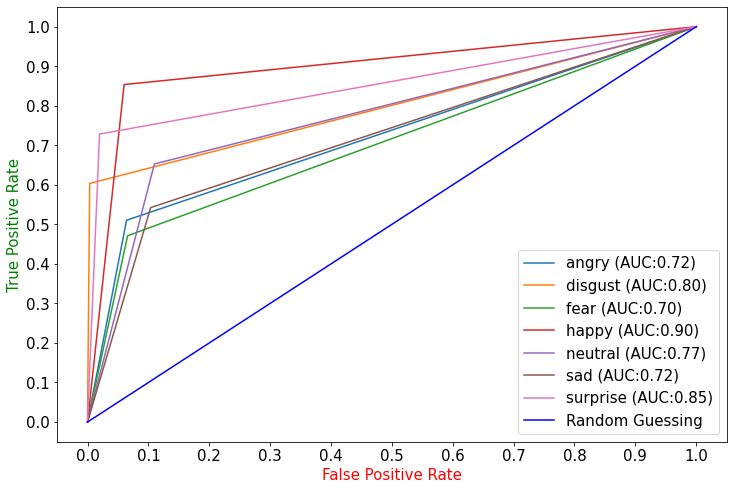

In [ ]:
plot_multiclass_roc_auc_score(model, X_test, Y_test)

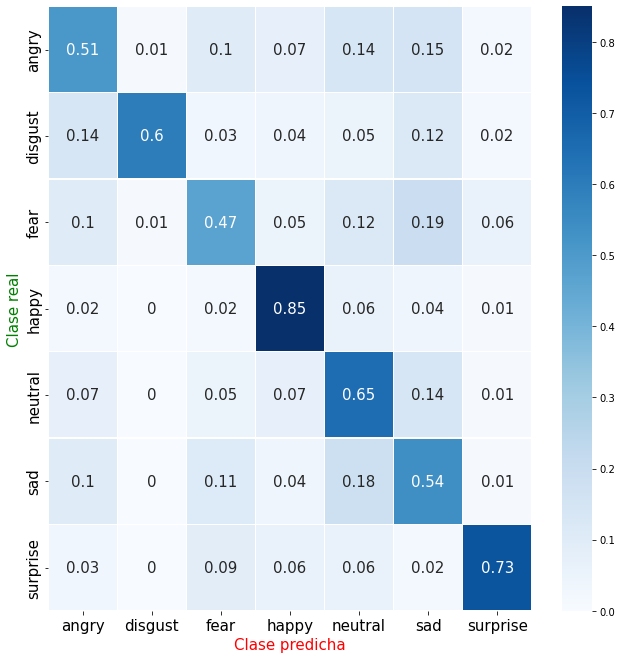

In [ ]:
print_confusion(model, X_test, Y_test)

In [ ]:
print(history.history)

AttributeError: ignored

In [ ]:
def print_metrics(history):
  # plt.figure(figsize=(30, 30))
  plt.rcParams['figure.figsize'] = [12, 7]
  history_frame = pd.DataFrame(history)
  history_frame.loc[:, ['f1_macro', 'val_f1_macro']].plot()
  plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(1))
  plt.ylabel('F1', fontsize = 15)
  plt.xlabel('Epoch', fontsize = 15)
  plt.legend(['Validación', 'Entrenamiento'],loc='lower right' ,fontsize=15)
  plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],fontsize = 15)
  plt.yticks([0,0.2,0.4,0.6,0.8,1], fontsize = 15)
  plt.show()

In [ ]:
history = {'loss': [1.368875503540039, 0.9842848181724548, 0.7436128854751587, 0.46088075637817383, 0.2558581233024597, 0.1562996357679367, 0.09260201454162598, 0.04931233450770378, 0.029854556545615196, 0.04107784107327461, 0.03352124243974686, 0.03331897780299187, 0.030753979459404945, 0.034278687089681625, 0.05006737634539604, 0.0629529356956482, 0.03451285883784294, 0.03147053346037865, 0.036062683910131454, 0.024141456931829453, 0.015462593175470829], 'accuracy': [0.4927026331424713, 0.6395903825759888, 0.730014979839325, 0.8377164006233215, 0.9143126010894775, 0.9497718214988708, 0.9717510342597961, 0.9858929514884949, 0.9911177754402161, 0.9868682026863098, 0.9896548390388489, 0.9888536930084229, 0.9902469515800476, 0.9882963299751282, 0.9828625321388245, 0.9788219928741455, 0.988435685634613, 0.9904211163520813, 0.9890626668930054, 0.9918840527534485, 0.9948099851608276], 'recall_macro': [0.40431711077690125, 0.5685737133026123, 0.6891946792602539, 0.8161329627037048, 0.902108907699585, 0.939010739326477, 0.9690206050872803, 0.9806202054023743, 0.9891018867492676, 0.979453980922699, 0.9854229092597961, 0.9832661151885986, 0.9863533973693848, 0.9870744943618774, 0.9791295528411865, 0.9771289229393005, 0.9861940145492554, 0.985761821269989, 0.9844249486923218, 0.9834482073783875, 0.9898754954338074], 'precision_macro': [0.4077034592628479, 0.6112560629844666, 0.7215254306793213, 0.8376571536064148, 0.9077044725418091, 0.9408806562423706, 0.968721866607666, 0.9797723889350891, 0.9879546165466309, 0.9785270094871521, 0.9851757884025574, 0.982155442237854, 0.9869248867034912, 0.9859793186187744, 0.9788654446601868, 0.9761205911636353, 0.983481228351593, 0.9832754135131836, 0.9853165149688721, 0.9839038252830505, 0.9890761375427246], 'f1_macro': [0.39395517110824585, 0.5725899338722229, 0.6933161616325378, 0.8204500079154968, 0.9017298221588135, 0.9373056292533875, 0.9678350687026978, 0.9797173738479614, 0.9879759550094604, 0.9779787063598633, 0.9848862290382385, 0.9824640154838562, 0.9862421154975891, 0.9861243367195129, 0.978493869304657, 0.9760227203369141, 0.9842213988304138, 0.9838446378707886, 0.9841874241828918, 0.9833513498306274, 0.9890041351318359], 'val_loss': [1.7741692066192627, 1.1768766641616821, 1.1011486053466797, 1.2107526063919067, 1.4078969955444336, 1.5642756223678589, 1.6995853185653687, 1.7751061916351318, 1.9127025604248047, 2.0323033332824707, 2.0359275341033936, 2.1015725135803223, 2.131154775619507, 2.1336829662323, 2.1975245475769043, 2.16852068901062, 2.1585605144500732, 2.080338954925537, 2.163600444793701, 2.141045331954956, 2.247089385986328], 'val_accuracy': [0.4380050301551819, 0.5547506213188171, 0.5808024406433105, 0.5824742317199707, 0.6086653470993042, 0.61451655626297, 0.6234326958656311, 0.6338813304901123, 0.6448871493339539, 0.6277514696121216, 0.6327667832374573, 0.6252437829971313, 0.6267762780189514, 0.637782096862793, 0.6170242428779602, 0.6085260510444641, 0.6163276433944702, 0.6310949921607971, 0.630259096622467, 0.6368069052696228, 0.6330454349517822], 'val_recall_macro': [0.3731873035430908, 0.47804906964302063, 0.5120496153831482, 0.5188040137290955, 0.5630733966827393, 0.5906458497047424, 0.5934525728225708, 0.6224095821380615, 0.6246132254600525, 0.6109060049057007, 0.6133636236190796, 0.6100215911865234, 0.6094515323638916, 0.611696183681488, 0.5972331762313843, 0.5979182124137878, 0.6027305126190186, 0.6028493642807007, 0.6118826270103455, 0.6182382106781006, 0.6191337704658508], 'val_precision_macro': [0.3904475271701813, 0.5257689952850342, 0.5318041443824768, 0.5578080415725708, 0.6050874590873718, 0.6192647218704224, 0.6229406595230103, 0.621263325214386, 0.6492388248443604, 0.61778724193573, 0.6266516447067261, 0.6239919066429138, 0.6161108613014221, 0.6206666827201843, 0.6201124787330627, 0.6044901013374329, 0.5926322340965271, 0.6190646886825562, 0.6372066736221313, 0.6263250708580017, 0.6421493291854858], 'val_f1_macro': [0.3039129376411438, 0.4681045711040497, 0.5024097561836243, 0.5268296599388123, 0.5677357316017151, 0.588654637336731, 0.5956068634986877, 0.6131113767623901, 0.6259499192237854, 0.6005339622497559, 0.6091983914375305, 0.6077576279640198, 0.6042813658714294, 0.6068006753921509, 0.5986881256103516, 0.5892766714096069, 0.5858555436134338, 0.6021921038627625, 0.6157994270324707, 0.616144061088562, 0.6217555999755859]}

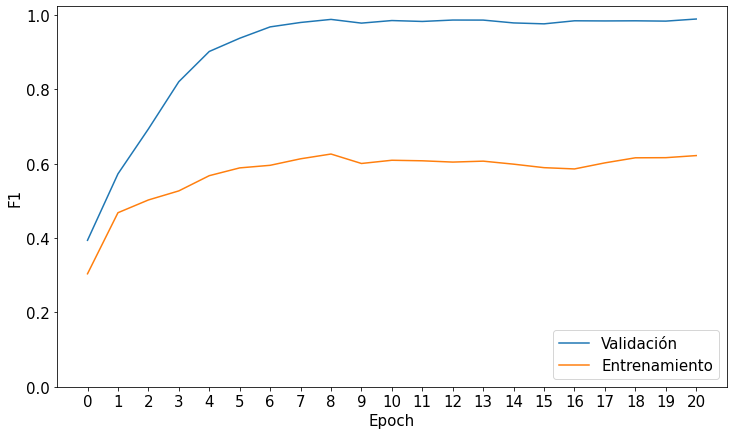

In [ ]:
print_metrics(history)

# Inception

In [ ]:
model = tf.keras.applications.InceptionResNetV2(
    include_top=True,
    weights=None,
    input_tensor=None,
    input_shape=None,
    pooling=None,
)

In [ ]:
model.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                               

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False
)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.405507 to fit



#### Búsqueda bayesiana

* Versión: InceptionV3, Inception-ResNetV2
* Optimizer: Adam, SGD
* Learning_rate: 0.001, 0.0001, 0.00001
* Data augmentation: True, False

In [ ]:
# !rm -rf /content/drive/MyDrive/Tensorflow/Inception_tuning_bayesian/tb
# !rm -rf /content/drive/MyDrive/Tensorflow/Inception_tuning_bayesian/tb_logs

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def Inception_version(version):
  if (version=="InceptionV3"):
    base_model = keras.applications.InceptionV3(
              weights='imagenet',  # Pesos preentrenados de ImageNet.
              include_top=False,
              )
    return base_model

  if (version=="InceptionResnetV2"):
    base_model = keras.applications.InceptionResNetV2(
              weights='imagenet',  # Pesos preentrenados de ImageNet.
              include_top=False,
              )
    return base_model
  

def opti(optimizer, learning_rate):

  if (optimizer=="Adam"):
    return keras.optimizers.Adam(learning_rate)
  if (optimizer=="SGD"):
    return keras.optimizers.SGD(learning_rate)


def RandomFlip():
  return tf.keras.layers.RandomFlip(mode="horizontal")

def RandomTranslation(factor):
  return tf.keras.layers.RandomTranslation(
                          height_factor = factor,
                          width_factor = factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )

def RandomZoom(factor):
  return tf.keras.layers.RandomZoom(
                          height_factor=factor,
                          width_factor=factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )
def RandomRotation(factor):
  return tf.keras.layers.RandomRotation(
                          factor = factor,
                          fill_mode="constant",
                          interpolation="bilinear",
                          fill_value=0.0
                          )


  
def DataAugmentation(factor):
  return Sequential([RandomFlip(),
                    RandomZoom(factor-0.10),
                    RandomTranslation(factor-0.18),
                    RandomRotation(factor-0.23)
                    ])
  

In [ ]:
class CustomBayesian(keras_tuner.BayesianOptimization):
  def run_trial(self, trial, *args, **kwargs):
    # You can add additional HyperParameters for preprocessing and custom training loops
    # via overriding `run_trial`
    kwargs['batch_size'] = trial.hyperparameters.Choice("batch_size", [32, 64, 128, 256])
    kwargs['callbacks'] = [early_stopping, keras.callbacks.TensorBoard("/content/drive/MyDrive/Tensorflow/InceptionV3_tuning_bayesian/tb_logs")]
    return super(CustomBayesian, self).run_trial(trial, *args, **kwargs)

In [ ]:
class MyHyperModel(keras_tuner.HyperModel):
    def build(self, hp):
      version = hp.Choice("version", ["InceptionV3", "InceptionResnetV2"])
      optimizer = hp.Choice("optimizer", ["Adam", "SGD"])
      learning_rate = hp.Choice("learning_rate", [0.01, 0.001, 0.0001])
      augmentation = hp.Boolean("augmentation")

      base_model = Inception_version(version)
      model = keras.Sequential()
      model.add(tf.keras.layers.ZeroPadding2D(padding=14))
      model.add(tf.keras.Input(shape=(img_width, img_height, 3)))
      if (augmentation):
        model.add(DataAugmentation(0.25))
      model.add(base_model)
      model.add(layers.GlobalAveragePooling2D())
      model.add(layers.Dense(num_classes, activation="softmax"))

      # Compile the model.
      model.compile(
          optimizer=opti(optimizer, learning_rate),
          loss="categorical_crossentropy",
          metrics=['accuracy', recall_macro, precision_macro, f1_macro],
      )
      return model

    def fit(self, hp, model, *args, **kwargs):
        
        return model.fit(
            *args,
            **kwargs,
        )


In [ ]:
tuner = CustomBayesian(
    hypermodel = MyHyperModel(),
    max_trials=30,
    executions_per_trial=1,
    # Do not resume the previous search in the same directory.
    overwrite=False,
    objective=keras_tuner.Objective("val_f1_macro", direction="max"),
    # Set a directory to store the intermediate results.
    directory="/content/drive/MyDrive/Tensorflow/Inception_tuning_bayesian/tb",
    project_name="Inception",
    beta=16
)

87924736/87910968 [==============================] - 3s 0us/step


In [ ]:
tuner.search_space_summary()

Search space summary
Default search space size: 5
version (Choice)
{'default': 'InceptionV3', 'conditions': [], 'values': ['InceptionV3', 'InceptionResnetV2'], 'ordered': False}
optimizer (Choice)
{'default': 'Adam', 'conditions': [], 'values': ['Adam', 'SGD'], 'ordered': False}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}
augmentation (Boolean)
{'default': False, 'conditions': []}
batch_size (Choice)
{'default': 32, 'conditions': [], 'values': [32, 64, 128, 256], 'ordered': True}


In [ ]:
tuner.search(
  X_train,
  Y_train,
  validation_data=(X_val, Y_val),
  epochs=500,
)

In [ ]:
tuner.results_summary(num_trials=20)

Results summary
Results in /content/drive/MyDrive/Tensorflow/Inception_tuning_bayesian/tb/Inception
Showing 20 best trials
Trial summary
Hyperparameters:
version: InceptionV3
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256
Score: 0.5707403421401978
Trial summary
Hyperparameters:
version: InceptionResnetV2
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256
Score: 0.5521615147590637
Trial summary
Hyperparameters:
version: InceptionResnetV2
optimizer: SGD
learning_rate: 0.01
augmentation: True
batch_size: 32
Score: 0.5417086482048035
Trial summary
Hyperparameters:
version: InceptionV3
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 256
Score: 0.5391600131988525
Trial summary
Hyperparameters:
version: InceptionResnetV2
optimizer: Adam
learning_rate: 0.0001
augmentation: True
batch_size: 32
Score: 0.5295282602310181
Trial summary
Hyperparameters:
version: InceptionV3
optimizer: Adam
learning_rate: 0.0001
augmentation: True


## Mejor modelo 1

* InceptionV3
* Adam
* 0.0001
* True
* 256

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=5)[0]
best_hp.values

{'version': 'InceptionV3',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': True,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=5)[0]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged1/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged1/Inception_checkpoints'

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/Inception_averaged1/Inception_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/Inception_averaged1/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=2)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):
	while(min_accuracy < 0.26):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)
	
		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()

	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/Inception_averaged1/best_model')
		best_model_id = i
		
	metrics.append(history)
	
 
print(best_model_id)

0
Epoch 1/500
99/99 [==============================] - 31s 207ms/step - loss: 1.7648 - accuracy: 0.2975 - recall_macro: 0.2222 - precision_macro: 0.2346 - f1_macro: 0.1975 - val_loss: 1.6938 - val_accuracy: 0.3455 - val_recall_macro: 0.2486 - val_precision_macro: 0.2545 - val_f1_macro: 0.2104
Epoch 2/500
99/99 [==============================] - 18s 186ms/step - loss: 1.5138 - accuracy: 0.4198 - recall_macro: 0.3447 - precision_macro: 0.3370 - f1_macro: 0.3300 - val_loss: 1.7239 - val_accuracy: 0.3550 - val_recall_macro: 0.2566 - val_precision_macro: 0.3216 - val_f1_macro: 0.2145
Epoch 3/500
99/99 [==============================] - 18s 185ms/step - loss: 1.3977 - accuracy: 0.4682 - recall_macro: 0.3856 - precision_macro: 0.3802 - f1_macro: 0.3738 - val_loss: 1.5524 - val_accuracy: 0.4104 - val_recall_macro: 0.3087 - val_precision_macro: 0.3381 - val_f1_macro: 0.2836
Epoch 4/500
99/99 [==============================] - 19s 191ms/step - loss: 1.3068 - accuracy: 0.5007 - recall_macro: 0.41

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(8):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

acc_avg = sum(acc_list)/8
f1_avg = sum(f1_list)/8
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.5681248307228088, 0.6227361559867859, 0.6132627725601196, 0.6085260510444641, 0.5990526676177979, 0.6020066738128662, 0.6231883764266968, 0.6273689866065979]
[0.4927303194999695, 0.5837425589561462, 0.5439818501472473, 0.5733917951583862, 0.5602498650550842, 0.5392399430274963, 0.568181574344635, 0.5815780162811279]
[0.5209032297134399, 0.6154512763023376, 0.5606838464736938, 0.6016958951950073, 0.586138129234314, 0.5771640539169312, 0.6071403622627258, 0.5795889496803284]
[0.49068230390548706, 0.5910736918449402, 0.5440918207168579, 0.5750623345375061, 0.5632417798042297, 0.5455830097198486, 0.5783445239067078, 0.5716822743415833]


In [ ]:
acc_list = [0.5578, 0.6211, 0.6096, 0.6102, 0.6113, 0.6076, 0.6185, 0.6243]
recall_list = [0.4961, 0.5955, 0.5533, 0.5715, 0.5573, 0.5539, 0.5747, 0.5733]
precision_list = [0.5108, 0.6054, 0.5746, 0.6061, 0.5973, 0.5919, 0.6011, 0.5943]
f1_list = [0.4937, 0.5905, 0.5550, 0.5785, 0.5665, 0.5647, 0.5811, 0.5739]

for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.5578 & 0.5108 & 0.4961 & 0.4937\\ 
\hline

1 & 0.6211 & 0.6054 & 0.5955 & 0.5905\\ 
\hline

2 & 0.6096 & 0.5746 & 0.5533 & 0.555\\ 
\hline

3 & 0.6102 & 0.6061 & 0.5715 & 0.5785\\ 
\hline

4 & 0.6113 & 0.5973 & 0.5573 & 0.5665\\ 
\hline

5 & 0.6076 & 0.5919 & 0.5539 & 0.5647\\ 
\hline

6 & 0.6185 & 0.6011 & 0.5747 & 0.5811\\ 
\hline

7 & 0.6243 & 0.5943 & 0.5733 & 0.5739\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.60755
average precision: 0.5851875
average recall: 0.55945
average f1: 0.5629875000000001

deviation acc: 0.020991222655467903
deviation precision: 0.03166676660385232
deviation recall: 0.029168623063637614
deviation f1: 0.0300583925765453


## Mejor modelo 2

* InceptionResnetV2
* Adam
* 0.0001
* True
* 256

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=5)[1]
best_hp.values

{'version': 'InceptionResnetV2',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': True,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=5)[1]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged2/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged2/Inception_checkpoints'

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/Inception_averaged2/Inception_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/Inception_averaged2/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=2)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):
	while(min_accuracy < 0.26):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)
	
		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()

	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/Inception_averaged2/best_model')
		best_model_id = i
		
	metrics.append(history)
	
 
print(best_model_id)

0


Epoch 1/500
99/99 [==============================] - 67s 433ms/step - loss: 1.6635 - accuracy: 0.3560 - recall_macro: 0.2909 - precision_macro: 0.2910 - f1_macro: 0.2787 - val_loss: 1.6233 - val_accuracy: 0.3516 - val_recall_macro: 0.2631 - val_precision_macro: 0.2950 - val_f1_macro: 0.2253
Epoch 2/500
99/99 [==============================] - 39s 396ms/step - loss: 1.4112 - accuracy: 0.4624 - recall_macro: 0.3831 - precision_macro: 0.3840 - f1_macro: 0.3762 - val_loss: 1.5579 - val_accuracy: 0.4132 - val_recall_macro: 0.3265 - val_precision_macro: 0.3259 - val_f1_macro: 0.2857
Epoch 3/500
99/99 [==============================] - 39s 390ms/step - loss: 1.2892 - accuracy: 0.5109 - recall_macro: 0.4289 - precision_macro: 0.4401 - f1_macro: 0.4239 - val_loss: 1.4446 - val_accuracy: 0.4508 - val_recall_macro: 0.3858 - val_precision_macro: 0.4107 - val_f1_macro: 0.3639
Epoch 4/500
99/99 [==============================] - 39s 392ms/step - loss: 1.1981 - accuracy: 0.5475 - recall_macro: 0.4697

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(8):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

acc_avg = sum(acc_list)/8
f1_avg = sum(f1_list)/8
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.6029534935951233, 0.6166062951087952, 0.6277514696121216, 0.6202284693717957, 0.6191139817237854, 0.6243032217025757, 0.6025640964508057, 0.609810471534729]
[0.5561361908912659, 0.5896570086479187, 0.5714382529258728, 0.5932521224021912, 0.5725113749504089, 0.5797036290168762, 0.5582864880561829, 0.55260169506073]
[0.5733790993690491, 0.6029966473579407, 0.6076543927192688, 0.6054278016090393, 0.6097404360771179, 0.5865245461463928, 0.5823394656181335, 0.5769093036651611]
[0.5558707118034363, 0.5852485299110413, 0.5767549276351929, 0.5935596823692322, 0.5805168747901917, 0.5755911469459534, 0.5592699646949768, 0.5527930855751038]


In [ ]:
acc_list = [0.6024, 0.6333, 0.6255, 0.6333, 0.6261, 0.6293, 0.6076, 0.6157]
recall_list = [0.5810, 0.6097, 0.5793, 0.6080, 0.5864, 0.5855, 0.5679, 0.5652]
precision_list = [0.5990, 0.6218, 0.5985, 0.6338, 0.6099, 0.5985, 0.5855, 0.5773]
f1_list = [0.5826, 0.6107, 0.5759, 0.6123, 0.5907, 0.5829, 0.5686, 0.5591]

for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.6024 & 0.599 & 0.581 & 0.5826\\ 
\hline

1 & 0.6333 & 0.6218 & 0.6097 & 0.6107\\ 
\hline

2 & 0.6255 & 0.5985 & 0.5793 & 0.5759\\ 
\hline

3 & 0.6333 & 0.6338 & 0.608 & 0.6123\\ 
\hline

4 & 0.6261 & 0.6099 & 0.5864 & 0.5907\\ 
\hline

5 & 0.6293 & 0.5985 & 0.5855 & 0.5829\\ 
\hline

6 & 0.6076 & 0.5855 & 0.5679 & 0.5686\\ 
\hline

7 & 0.6157 & 0.5773 & 0.5652 & 0.5591\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.62165
average precision: 0.6030375
average recall: 0.5853750000000001
average f1: 0.5853499999999999

deviation acc: 0.011759251676871248
deviation precision: 0.018411637430091405
deviation recall: 0.01635811288452483
deviation f1: 0.018784644184622095


## Mejor modelo 3

* InceptionResnet
* SGD
* 0.01
* True
* 256

In [ ]:
batch_size = 32
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=8)[2]
best_hp.values

{'version': 'InceptionResnetV2',
 'optimizer': 'SGD',
 'learning_rate': 0.01,
 'augmentation': True,
 'batch_size': 32}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=8)[6]
  model = tuner.hypermodel.build(best_hp)
  return model

#### Cross-validation

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged3/tensorboard_logs'
!rm -r '/content/drive/MyDrive/Tensorflow/Inception_averaged3/Inception_checkpoints'

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/Inception_averaged3/Inception_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/Inception_averaged3/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

# Create StratifiedKFold object.
skf = StratifiedKFold(n_splits=8, shuffle=True, random_state=5)
lst_accu_stratified = []

for i, (train_index, test_index) in enumerate(skf.split(X_train_val, Y_train_val)):

	if (i>=7):
		print(i)
		x_train_fold, x_val_fold = X_train_val[train_index], X_train_val[test_index]
		y_train_fold, y_val_fold = keras.utils.to_categorical(Y_train_val[train_index], dtype ="uint8", num_classes = 7), keras.utils.to_categorical(Y_train_val[test_index], dtype ="uint8", num_classes = 7)

		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			x_train_fold,
			y_train_fold,
			validation_data=(x_val_fold, y_val_fold),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)

		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
		
		min_accuracy = 0
		gc.collect()

		if (history.history["val_f1_macro"][-1] > best_f1):

			best_f1 = history.history["val_f1_macro"][-1]
			best_model = model
			best_model.save_weights('/content/drive/MyDrive/Tensorflow/Inception_averaged3/best_model')
			best_model_id = i
			
		metrics.append(history)

7
219070464/219055592 [==============================] - 1s 0us/step
Epoch 1/500
786/786 [==============================] - 162s 160ms/step - loss: 1.4148 - accuracy: 0.4704 - recall_macro: 0.4038 - precision_macro: 0.3927 - f1_macro: 0.3747 - val_loss: nan - val_accuracy: 0.1382 - val_recall_macro: 0.1403 - val_precision_macro: 0.0196 - val_f1_macro: 0.0335
Epoch 2/500
786/786 [==============================] - 118s 150ms/step - loss: 1.0311 - accuracy: 0.6221 - recall_macro: 0.5485 - precision_macro: 0.5422 - f1_macro: 0.5205 - val_loss: nan - val_accuracy: 0.1382 - val_recall_macro: 0.1403 - val_precision_macro: 0.0196 - val_f1_macro: 0.0335
Epoch 3/500
786/786 [==============================] - 117s 148ms/step - loss: 0.7413 - accuracy: 0.7303 - recall_macro: 0.6586 - precision_macro: 0.6483 - f1_macro: 0.6306 - val_loss: nan - val_accuracy: 0.1382 - val_recall_macro: 0.1403 - val_precision_macro: 0.0196 - val_f1_macro: 0.0335
Epoch 4/500
786/786 [==============================] - 

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(3):
  acc_list.append(metrics[i].history["val_accuracy"][-1])
  f1_list.append(metrics[i].history["val_f1_macro"][-1])
  precision_list.append(metrics[i].history["val_recall_macro"][-1])
  recall_list.append(metrics[i].history["val_precision_macro"][-1])

acc_avg = sum(acc_list)/8
f1_avg = sum(f1_list)/8
precision_avg = sum(precision_list)/8
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

IndexError: ignored

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

In [ ]:
acc_list = [0.6055, 0.6119, 0.6297, 0.6358, 0.6230, 0.1385, 0.1385, 0.1382]
recall_list = [0.5327, 0.5322, 0.5514, 0.5639, 0.5405, 0.1416, 0.1378, 0.1403]
precision_list = [0.5441, 0.5344, 0.5602, 0.5603, 0.5433, 0.0199, 0.0196, 0.0196]
f1_list = [0.5147, 0.5069, 0.5313, 0.5378, 0.5179, 0.0342, 0.0337, 0.0335]

for i in range(8):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.6055 & 0.5441 & 0.5327 & 0.5147\\ 
\hline

1 & 0.6119 & 0.5344 & 0.5322 & 0.5069\\ 
\hline

2 & 0.6297 & 0.5602 & 0.5514 & 0.5313\\ 
\hline

3 & 0.6358 & 0.5603 & 0.5639 & 0.5378\\ 
\hline

4 & 0.623 & 0.5433 & 0.5405 & 0.5179\\ 
\hline

5 & 0.1385 & 0.0199 & 0.1416 & 0.0342\\ 
\hline

6 & 0.1385 & 0.0196 & 0.1378 & 0.0337\\ 
\hline

7 & 0.1382 & 0.0196 & 0.1403 & 0.0335\\ 
\hline



In [ ]:
# acc_list = [0.6344385743141174, 0.6260796785354614, 0.6115909814834595, 0.6266369223594666, 0.6182780861854553, 0.6262542009353638, 0.6081382632255554, 0.6482720375061035]
acc_avg = sum(acc_list)/8

# f1_list = [0.5785022974014282, 0.5675160884857178, 0.5630576014518738, 0.6068615317344666, 0.5741955637931824, 0.5865286588668823, 0.5645330548286438, 0.5973895788192749]
f1_avg = sum(f1_list)/8

# precision_list = [0.5822791457176208, 0.564594030380249, 0.5660096406936646, 0.5994992852210999, 0.5659705996513367, 0.595296323299408, 0.5550307035446167, 0.6069095730781555]
precision_avg = sum(precision_list)/8

# recall_list = [0.6143820285797119, 0.6063836812973022, 0.590752363204956, 0.6374186873435974, 0.6083559393882751, 0.6304227709770203, 0.6163391470909119, 0.6046091914176941]
recall_avg = sum(recall_list)/8

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))

print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.4401375
average precision: 0.35017499999999996
average recall: 0.39254999999999995
average f1: 0.33875

deviation acc: 0.25004004786376577
deviation precision: 0.27379535501642727
deviation recall: 0.2094656535091135
deviation f1: 0.25270189099863444


## Modelo final

In [ ]:
batch_size = 256
optimizer = keras.optimizers.Adam(1e-4)

In [ ]:
best_hp = tuner.get_best_hyperparameters(num_trials=2)[1]
best_hp.values

{'version': 'InceptionResnetV2',
 'optimizer': 'Adam',
 'learning_rate': 0.0001,
 'augmentation': True,
 'batch_size': 256}

In [ ]:
def get_model():
  best_hp = tuner.get_best_hyperparameters(num_trials=2)[1]
  model = tuner.hypermodel.build(best_hp)
  return model

In [ ]:
model = get_model()
model.compile(
                optimizer=optimizer,
                loss=categorical_crossentropy,
                metrics=['accuracy', recall_macro, precision_macro, f1_macro]
              )

219070464/219055592 [==============================] - 6s 0us/step


### Mejor modelo

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def create_checkpoint():
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/Inception_final/Inception_checkpoints',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard():
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/Inception_final/tensorboard_logs")

In [ ]:
model = get_model()
model.compile(
                optimizer=optimizer,
                loss=categorical_crossentropy,
                metrics=['accuracy', recall_macro, precision_macro, f1_macro]
              )
history = model.fit(
  X_train_testing,
  Y_train_testing,
  validation_data=(X_test_testing, Y_test_testing),
  batch_size=batch_size,
  epochs=500,
  callbacks=[early_stopping, create_checkpoint(), create_tensorboard()]
)

Epoch 1/500
113/113 [==============================] - 94s 550ms/step - loss: 1.6447 - accuracy: 0.3728 - recall_macro: 0.3076 - precision_macro: 0.3064 - f1_macro: 0.2969 - val_loss: 1.6046 - val_accuracy: 0.4068 - val_recall_macro: 0.3078 - val_precision_macro: 0.3519 - val_f1_macro: 0.2892
Epoch 2/500
113/113 [==============================] - 57s 503ms/step - loss: 1.4022 - accuracy: 0.4731 - recall_macro: 0.3948 - precision_macro: 0.3983 - f1_macro: 0.3881 - val_loss: 1.9188 - val_accuracy: 0.4595 - val_recall_macro: 0.3723 - val_precision_macro: 0.3803 - val_f1_macro: 0.3447
Epoch 3/500
113/113 [==============================] - 58s 514ms/step - loss: 1.2700 - accuracy: 0.5271 - recall_macro: 0.4461 - precision_macro: 0.4577 - f1_macro: 0.4412 - val_loss: 2.9791 - val_accuracy: 0.4804 - val_recall_macro: 0.3990 - val_precision_macro: 0.3994 - val_f1_macro: 0.3741
Epoch 4/500
113/113 [==============================] - 58s 510ms/step - loss: 1.1632 - accuracy: 0.5640 - recall_macro

### Iteraciones

In [ ]:
# !rm -r '/content/drive/MyDrive/Tensorflow/Inception_test/tensorboard_logs'
# !rm -r '/content/drive/MyDrive/Tensorflow/Inception_test/Inception_checkpoints'

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
def create_checkpoint(i):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=f'/content/drive/MyDrive/Tensorflow/Inception_test/Inception_checkpoints/{i}',
    save_weights_only=True ,
    monitor='val_f1_macro',
    mode='max',
    save_best_only=True
  )

def create_tensorboard(i):
  return keras.callbacks.TensorBoard(f"/content/drive/MyDrive/Tensorflow/Inception_test/tensorboard_logs/{i}")

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.
	
# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0


for i in range(5, 10):
	X_train_val, X_test, Y_train_val_aux, Y_test_aux = train_test_split(X, Y, test_size=test_ratio, shuffle=True, random_state=i)
	Y_train_val = keras.utils.to_categorical(Y_train_val_aux, dtype ="uint8", num_classes = 7)
	Y_test = keras.utils.to_categorical(Y_test_aux, dtype ="uint8", num_classes = 7)
 
	while(min_accuracy < 0.26):
		print(i)
	
		model = get_model()
		model.compile(
										optimizer=optimizer,
										loss=categorical_crossentropy,
										metrics=['accuracy', recall_macro, precision_macro, f1_macro]
									)
		history = model.fit(
			X_train_val,
			Y_train_val,
			validation_data=(X_test, Y_test),
			batch_size=batch_size,
			epochs=500,
			callbacks=[early_stopping, create_checkpoint(i), create_tensorboard(i)]
		)

		min_accuracy = history.history["val_accuracy"][-1]
		print(min_accuracy)
	
	min_accuracy = 0
	gc.collect()


	if (history.history["val_f1_macro"][-1] > best_f1):

		best_f1 = history.history["val_f1_macro"][-1]
		best_model = model
		best_model.save_weights('/content/drive/MyDrive/Tensorflow/Inception_test/best_model')
		best_model_id = i
		best_model
		
	metrics.append(history)
	model.save_weights(f'/content/drive/MyDrive/Tensorflow/Inception_test/InceptionV3_weights/{i}')
 
print(i)

5
219070464/219055592 [==============================] - 1s 0us/step
Epoch 1/500
113/113 [==============================] - 95s 556ms/step - loss: 1.6474 - accuracy: 0.3720 - recall_macro: 0.3062 - precision_macro: 0.3055 - f1_macro: 0.2955 - val_loss: 1.8352 - val_accuracy: 0.3541 - val_recall_macro: 0.2573 - val_precision_macro: 0.3265 - val_f1_macro: 0.2313
Epoch 2/500
113/113 [==============================] - 59s 519ms/step - loss: 1.3940 - accuracy: 0.4714 - recall_macro: 0.3889 - precision_macro: 0.3866 - f1_macro: 0.3812 - val_loss: 2.3475 - val_accuracy: 0.4329 - val_recall_macro: 0.3345 - val_precision_macro: 0.3731 - val_f1_macro: 0.3199
Epoch 3/500
113/113 [==============================] - 58s 516ms/step - loss: 1.2594 - accuracy: 0.5247 - recall_macro: 0.4421 - precision_macro: 0.4488 - f1_macro: 0.4360 - val_loss: 1.5283 - val_accuracy: 0.4912 - val_recall_macro: 0.3949 - val_precision_macro: 0.4220 - val_f1_macro: 0.3937
Epoch 4/500
113/113 [============================

In [ ]:
acc_list = []
acc_avg = 0

f1_list = []
f1_avg = 0

precision_list = []
precision_avg = 0

recall_list = []
recall_avg = 0

for i in range(5):
  acc_list.append(metrics[i].history["val_accuracy"][-7])
  f1_list.append(metrics[i].history["val_f1_macro"][-7])
  precision_list.append(metrics[i].history["val_recall_macro"][-7])
  recall_list.append(metrics[i].history["val_precision_macro"][-7])

print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

[0.6210643649101257, 0.6330454349517822, 0.5972415804862976, 0.6369462013244629, 0.6368069052696228]
[0.6060135364532471, 0.6075072288513184, 0.5716308951377869, 0.603352427482605, 0.6168586015701294]
[0.6408692598342896, 0.6315619349479675, 0.5942114591598511, 0.6288263201713562, 0.6245955228805542]
[0.6119117736816406, 0.6064385175704956, 0.5694452524185181, 0.6026036739349365, 0.6141363978385925]


In [ ]:
acc_list = [0.6422401666641235, 0.6363889575004578, 0.6468375325202942, 0.6490665674209595, 0.6327667832374573,0.6210643649101257, 0.6330454349517822, 0.5972415804862976, 0.6369462013244629, 0.6368069052696228]
precision_list = [0.6123863458633423, 0.6111226677894592, 0.6203314065933228, 0.6211965084075928, 0.6218686699867249, 0.6060135364532471, 0.6075072288513184, 0.5716308951377869, 0.603352427482605, 0.6168586015701294]
recall_list = [0.6325801610946655, 0.6173335909843445, 0.6266569495201111, 0.6538453102111816, 0.6459648013114929, 0.6408692598342896, 0.6315619349479675, 0.5942114591598511, 0.6288263201713562, 0.6245955228805542]
f1_list = [0.6126272082328796, 0.6058040261268616, 0.6156693696975708, 0.6238211989402771, 0.620669960975647, 0.6119117736816406, 0.6064385175704956, 0.5694452524185181, 0.6026036739349365, 0.6141363978385925]

In [ ]:
# acc_list = []
# acc_avg = 0

# f1_list = []
# f1_avg = 0

# precision_list = []
# precision_avg = 0

# recall_list = []
# recall_avg = 0

# for i in range(10):
#   acc_list.append(metrics[i].history["val_accuracy"][-7])
#   f1_list.append(metrics[i].history["val_f1_macro"][-7])
#   precision_list.append(metrics[i].history["val_recall_macro"][-7])
#   recall_list.append(metrics[i].history["val_precision_macro"][-7])

acc_avg = sum(acc_list)/10
f1_avg = sum(f1_list)/10
precision_avg = sum(precision_list)/10
recall_avg = sum(recall_list)/10

acc_stdev = stdev(acc_list)
f1_stdev = stdev(f1_list)
precision_stdev = stdev(precision_list)
recall_stdev = stdev(recall_list)

In [ ]:
print(acc_list)
print(precision_list)
print(recall_list)
print(f1_list)

In [ ]:
for i in range(10):
    print(i, round(acc_list[i], 4), round(precision_list[i], 4), round(recall_list[i], 4), round(f1_list[i], 4), sep=' & ', end='\\\ \n')
    print("\hline")
    print("")

0 & 0.6422 & 0.6124 & 0.6326 & 0.6126\\ 
\hline

1 & 0.6364 & 0.6111 & 0.6173 & 0.6058\\ 
\hline

2 & 0.6468 & 0.6203 & 0.6267 & 0.6157\\ 
\hline

3 & 0.6491 & 0.6212 & 0.6538 & 0.6238\\ 
\hline

4 & 0.6328 & 0.6219 & 0.646 & 0.6207\\ 
\hline

5 & 0.6211 & 0.606 & 0.6409 & 0.6119\\ 
\hline

6 & 0.633 & 0.6075 & 0.6316 & 0.6064\\ 
\hline

7 & 0.5972 & 0.5716 & 0.5942 & 0.5694\\ 
\hline

8 & 0.6369 & 0.6034 & 0.6288 & 0.6026\\ 
\hline

9 & 0.6368 & 0.6169 & 0.6246 & 0.6141\\ 
\hline



In [ ]:
print("average acc: {}".format(acc_avg))
print("average precision: {}".format(precision_avg))
print("average recall: {}".format(recall_avg))
print("average f1: {}".format(f1_avg))
print("")
print("deviation acc: {}".format(acc_stdev))
print("deviation precision: {}".format(precision_stdev))
print("deviation recall: {}".format(recall_stdev))
print("deviation f1: {}".format(f1_stdev))

average acc: 0.6332404494285584
average precision: 0.6092268288135528
average recall: 0.6296445310115815
average f1: 0.6083127379417419

deviation acc: 0.01489647567089091
deviation precision: 0.014755288415757531
deviation recall: 0.016440016409737062
deviation f1: 0.015150714177849196


#### Métricas

In [ ]:
model = get_model()

In [ ]:
model.load_weights('/content/drive/MyDrive/Tensorflow/Inception_test/InceptionV3_weights/3')

In [ ]:
model.evaluate(X_test_testing, Y_test_testing)

225/225 [==============================] - 9s 38ms/step - loss: 2.0971 - accuracy: 0.6152 - recall_macro: 0.5412 - precision_macro: 0.5445 - f1_macro: 0.5208


[2.0971248149871826,
 0.61521315574646,
 0.5412003397941589,
 0.5444867014884949,
 0.520767092704773]

ROC AUC score: 0.7755410049224483


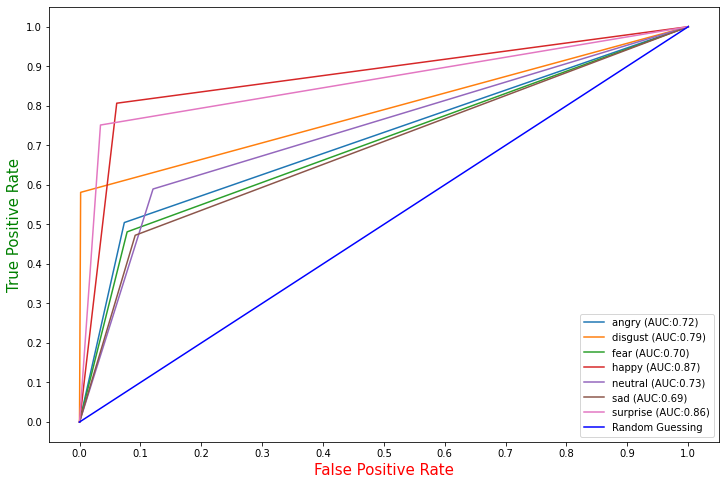

In [ ]:
plot_multiclass_roc_auc_score(model, X_test_testing, Y_test_testing)

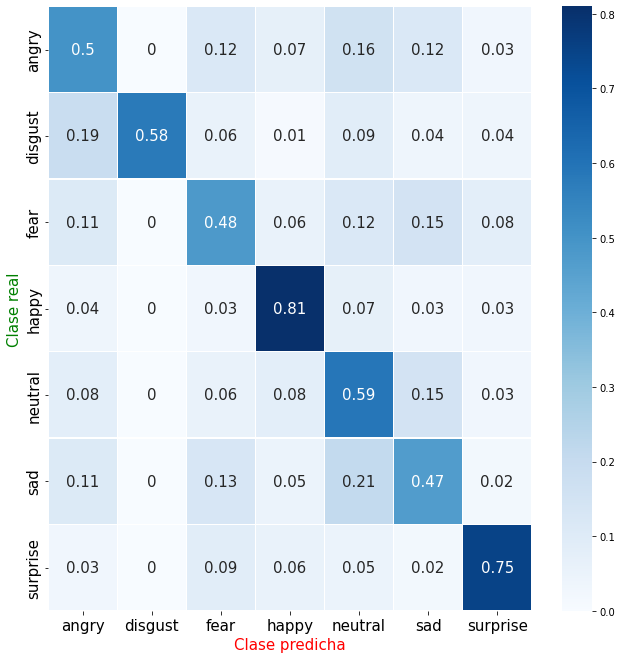

In [ ]:
print_confusion(model, X_test_testing, Y_test_testing)

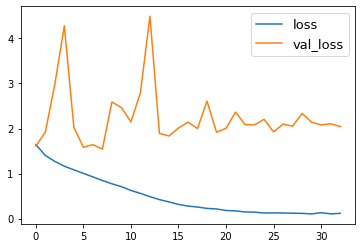

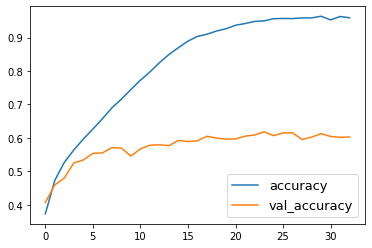

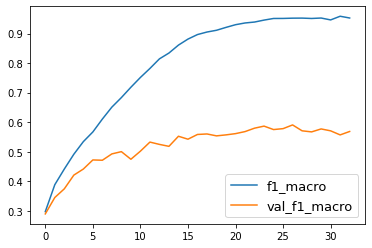

In [ ]:
print_metrics(history)

In [ ]:
print(history.history)

{'loss': [1.6447391510009766, 1.4021859169006348, 1.2700330018997192, 1.1631745100021362, 1.0833700895309448, 1.004389762878418, 0.9265854954719543, 0.8456210494041443, 0.7733076810836792, 0.709495484828949, 0.6255223751068115, 0.5613315105438232, 0.48781299591064453, 0.42242568731307983, 0.37141749262809753, 0.3158488869667053, 0.2791665494441986, 0.2577553391456604, 0.22767207026481628, 0.21495509147644043, 0.18117311596870422, 0.17156438529491425, 0.14868362247943878, 0.1438194215297699, 0.1251326948404312, 0.12804408371448517, 0.12649402022361755, 0.1203065887093544, 0.11724533885717392, 0.10493264347314835, 0.13285256922245026, 0.10566190630197525, 0.11786168813705444], 'accuracy': [0.37280991673469543, 0.47309204936027527, 0.527082085609436, 0.5639694929122925, 0.5966770052909851, 0.6263192892074585, 0.6572503447532654, 0.6897836923599243, 0.7158033847808838, 0.7447142004966736, 0.77247554063797, 0.797206461429596, 0.8248284459114075, 0.849489688873291, 0.8699014186859131, 0.8894

In [ ]:
history = {'loss': [1.7359097003936768, 1.4217760562896729, 1.2720143795013428, 1.1801708936691284, 1.1040735244750977, 1.0370885133743286, 0.9765807390213013, 0.9163177609443665, 0.856361985206604, 0.8116814494132996, 0.7619752883911133, 0.7075780630111694, 0.6661086082458496, 0.6221424341201782, 0.5766614079475403, 0.5299518704414368, 0.4979204833507538, 0.46364709734916687, 0.42525994777679443, 0.3942895233631134, 0.3636937737464905, 0.33669570088386536, 0.3092149794101715, 0.3083544075489044, 0.2738902270793915, 0.2786310613155365, 0.25998666882514954, 0.23834024369716644, 0.2172425538301468, 0.21929314732551575, 0.2017640620470047, 0.18945975601673126, 0.16723580658435822], 'accuracy': [0.3149535059928894, 0.45490962266921997, 0.5150301456451416, 0.5517085194587708, 0.5845901966094971, 0.6109234094619751, 0.6348183751106262, 0.6581211686134338, 0.6817374229431152, 0.7003030180931091, 0.7189382910728455, 0.7360061407089233, 0.7577414512634277, 0.7706642746925354, 0.789404034614563, 0.8078651428222656, 0.8189069628715515, 0.8327005505561829, 0.8460413217544556, 0.8582674264907837, 0.8711205720901489, 0.8805949091911316, 0.8888153433799744, 0.8915671110153198, 0.9032707810401917, 0.9021909236907959, 0.9086697697639465, 0.9151485562324524, 0.9228116869926453, 0.924483597278595, 0.9310669302940369, 0.9333658218383789, 0.9392176866531372], 'recall_macro': [0.23589421808719635, 0.36991339921951294, 0.4246693551540375, 0.4592239260673523, 0.4986250400543213, 0.5396631360054016, 0.5692270994186401, 0.599570631980896, 0.63238126039505, 0.6571114659309387, 0.6835064888000488, 0.7057201862335205, 0.7290024161338806, 0.7471920251846313, 0.7726432085037231, 0.7971177101135254, 0.8018708229064941, 0.8207685947418213, 0.8332256078720093, 0.8467777371406555, 0.8614588975906372, 0.8740792870521545, 0.8799911737442017, 0.8824043869972229, 0.896077036857605, 0.894496738910675, 0.9032168984413147, 0.9119096994400024, 0.9163070917129517, 0.9174681305885315, 0.9197556972503662, 0.9276623129844666, 0.937798023223877], 'precision_macro': [0.2431604117155075, 0.3643375635147095, 0.4194413125514984, 0.45963460206985474, 0.5261952877044678, 0.5730412006378174, 0.61014723777771, 0.6351334452629089, 0.6691408157348633, 0.686465322971344, 0.7043853998184204, 0.7334921956062317, 0.7490121722221375, 0.7641480565071106, 0.7858219146728516, 0.8084878921508789, 0.8121865391731262, 0.8297352194786072, 0.8413782119750977, 0.8565537929534912, 0.8637933731079102, 0.8761501312255859, 0.8849548697471619, 0.8835757970809937, 0.896817684173584, 0.8948632478713989, 0.9062350988388062, 0.911484956741333, 0.9151645302772522, 0.9160448312759399, 0.9218754768371582, 0.9276997447013855, 0.9376831650733948], 'f1_macro': [0.21206338703632355, 0.3554043173789978, 0.41272661089897156, 0.45022863149642944, 0.4952259957790375, 0.5404148101806641, 0.5730552077293396, 0.6038731932640076, 0.6370274424552917, 0.6611144542694092, 0.6842483282089233, 0.7091946005821228, 0.7308834791183472, 0.7482128739356995, 0.7721652984619141, 0.7963078618049622, 0.7997269630432129, 0.8195548057556152, 0.8321025371551514, 0.8465587496757507, 0.8585025668144226, 0.8712044954299927, 0.8784193396568298, 0.8793017864227295, 0.8935142159461975, 0.8910481929779053, 0.9014453887939453, 0.909659206867218, 0.9130828380584717, 0.9142073392868042, 0.917960524559021, 0.9252322912216187, 0.9361456036567688], 'val_loss': [1.6807796955108643, 1.413570761680603, 1.2963547706604004, 1.2347849607467651, 1.15244460105896, 1.1231154203414917, 1.1078500747680664, 1.1054028272628784, 1.1036525964736938, 1.1164196729660034, 1.1619411706924438, 1.1647567749023438, 1.168105125427246, 1.2030848264694214, 1.2405962944030762, 1.2543827295303345, 1.2729041576385498, 1.324092984199524, 1.3797342777252197, 1.3794629573822021, 1.4020166397094727, 1.4073231220245361, 1.4565293788909912, 1.4937782287597656, 1.5167133808135986, 1.5383961200714111, 1.5469218492507935, 1.6066272258758545, 1.6355079412460327, 1.611359715461731, 1.585253119468689, 1.61126708984375, 1.6983789205551147], 'val_accuracy': [0.36932292580604553, 0.4667038023471832, 0.5143494009971619, 0.539286732673645, 0.5604625344276428, 0.5848425626754761, 0.5958484411239624, 0.5958484411239624, 0.6035107374191284, 0.6089439988136292, 0.6029534935951233, 0.6122875213623047, 0.6128448247909546, 0.607968807220459, 0.6223182082176208, 0.6186960339546204, 0.6150738596916199, 0.6223182082176208, 0.6210643649101257, 0.6110337376594543, 0.6153524518013, 0.6212036609649658, 0.6175814867019653, 0.6238506436347961, 0.6252437829971313, 0.6192532777786255, 0.6288659572601318, 0.6212036609649658, 0.6251044869422913, 0.6277514696121216, 0.622178852558136, 0.6258010864257812, 0.630955696105957], 'val_recall_macro': [0.2976357340812683, 0.37437447905540466, 0.41420868039131165, 0.4320670962333679, 0.4585876762866974, 0.49346038699150085, 0.5086057782173157, 0.5044606924057007, 0.5211221575737, 0.5385194420814514, 0.5178719162940979, 0.5301980376243591, 0.5393676161766052, 0.5304783582687378, 0.5516107082366943, 0.5647339820861816, 0.5582167506217957, 0.5627303123474121, 0.5631268620491028, 0.5460238456726074, 0.5667707324028015, 0.5787758827209473, 0.5876743793487549, 0.5670878887176514, 0.5873661041259766, 0.5835937857627869, 0.5853423476219177, 0.5720625519752502, 0.5811585783958435, 0.5785922408103943, 0.5747267007827759, 0.5697339773178101, 0.5735664963722229], 'val_precision_macro': [0.2684645354747772, 0.3452354073524475, 0.40133774280548096, 0.4285142719745636, 0.4722462296485901, 0.5257513523101807, 0.5385804176330566, 0.5460464358329773, 0.561704158782959, 0.5589336156845093, 0.568915843963623, 0.5737350583076477, 0.5767548084259033, 0.5729795098304749, 0.611867368221283, 0.5904317498207092, 0.5835061073303223, 0.5923749208450317, 0.5995357036590576, 0.5907940864562988, 0.5974615812301636, 0.5934069156646729, 0.5827656388282776, 0.5956193208694458, 0.5910072922706604, 0.5883656740188599, 0.6105043292045593, 0.6133509278297424, 0.6065377593040466, 0.6165844202041626, 0.605603039264679, 0.5945314764976501, 0.6045568585395813], 'val_f1_macro': [0.24534130096435547, 0.3407075107097626, 0.39024680852890015, 0.4130418598651886, 0.4508231580257416, 0.4922637641429901, 0.5111923813819885, 0.5079533457756042, 0.527163565158844, 0.5383126735687256, 0.5271936655044556, 0.5362641215324402, 0.5489328503608704, 0.5371217131614685, 0.563558042049408, 0.5678750276565552, 0.5611957311630249, 0.5664069056510925, 0.5703491568565369, 0.5530065298080444, 0.5713952779769897, 0.5767567157745361, 0.57584547996521, 0.5739938020706177, 0.5809037685394287, 0.5767855644226074, 0.5865675210952759, 0.5771910548210144, 0.582769513130188, 0.5871647000312805, 0.5791062712669373, 0.572852373123169, 0.5809231400489807]}

### Iteraciones métricas

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=6, # how many epochs to wait before stopping
    restore_best_weights=True,
    monitor='val_f1_macro',
    mode="max"
)

In [ ]:
# This code may not be run on GFG IDE
# as required packages are not found.

# STRATIFIES K-FOLD CROSS VALIDATION { 10-fold }

# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold			


best_f1 = 0
metrics = []
min_accuracy = 0

i=3

X_train_val, X_test, Y_train_val_aux, Y_test_aux = train_test_split(X, Y, test_size=test_ratio, shuffle=True, random_state=i)
Y_train_val = keras.utils.to_categorical(Y_train_val_aux, dtype ="uint8", num_classes = 7)
Y_test = keras.utils.to_categorical(Y_test_aux, dtype ="uint8", num_classes = 7)

print(i)

model = get_model()
model.compile(
								optimizer=optimizer,
								loss=categorical_crossentropy,
								metrics=['accuracy', recall_macro, precision_macro, f1_macro]
							)
history = model.fit(
	X_train_val,
	Y_train_val,
	validation_data=(X_test, Y_test),
	batch_size=batch_size,
	epochs=500,
	callbacks=[early_stopping]
)

min_accuracy = history.history["val_accuracy"][-1]
print(min_accuracy)

min_accuracy = 0
gc.collect()


3
Epoch 1/500
113/113 [==============================] - 78s 508ms/step - loss: 1.4850 - accuracy: 0.4506 - recall_macro: 0.3725 - precision_macro: 0.3690 - f1_macro: 0.3624 - val_loss: 1.5038 - val_accuracy: 0.4685 - val_recall_macro: 0.3641 - val_precision_macro: 0.4192 - val_f1_macro: 0.3420
Epoch 2/500
113/113 [==============================] - 53s 473ms/step - loss: 1.1928 - accuracy: 0.5496 - recall_macro: 0.4632 - precision_macro: 0.4686 - f1_macro: 0.4560 - val_loss: 1.2278 - val_accuracy: 0.5436 - val_recall_macro: 0.4431 - val_precision_macro: 0.5003 - val_f1_macro: 0.4366
Epoch 3/500
113/113 [==============================] - 53s 473ms/step - loss: 1.0959 - accuracy: 0.5908 - recall_macro: 0.5198 - precision_macro: 0.5446 - f1_macro: 0.5181 - val_loss: 1.1561 - val_accuracy: 0.5641 - val_recall_macro: 0.4719 - val_precision_macro: 0.4959 - val_f1_macro: 0.4697
Epoch 4/500
113/113 [==============================] - 53s 473ms/step - loss: 1.0198 - accuracy: 0.6190 - recall_mac

1435

#### Métricas

In [ ]:
model.evaluate(X_test_testing, Y_test_testing)

225/225 [==============================] - 8s 37ms/step - loss: 0.5567 - accuracy: 0.8902 - recall_macro: 0.7970 - precision_macro: 0.7950 - f1_macro: 0.7849


[0.5566954612731934,
 0.8902201056480408,
 0.7970067262649536,
 0.7949857115745544,
 0.7849259972572327]

ROC AUC score: 0.7911442370205256


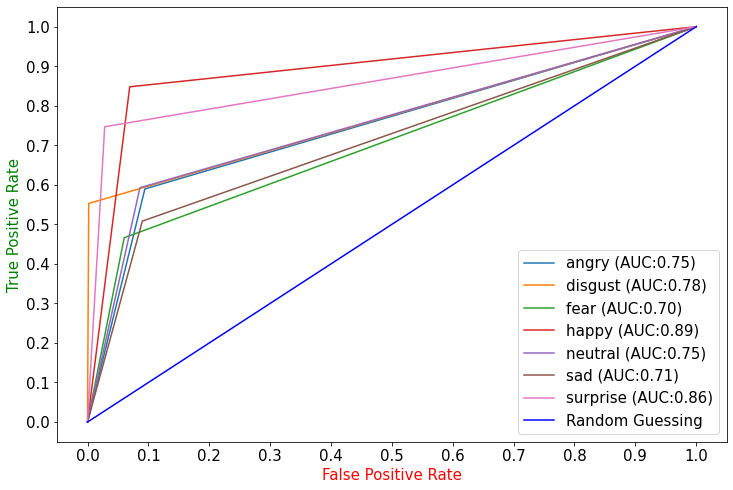

In [ ]:
plot_multiclass_roc_auc_score(model, X_test, Y_test)

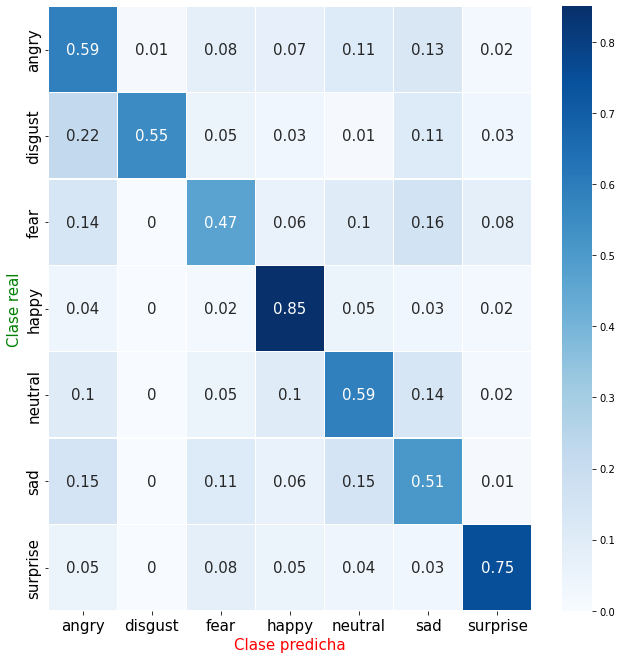

In [ ]:
print_confusion(model, X_test, Y_test)

In [ ]:
print(history.history)

{'loss': [1.4849553108215332, 1.1927874088287354, 1.0958583354949951, 1.0197510719299316, 0.9450559616088867, 0.8887585997581482, 0.8478721380233765, 0.784555196762085, 0.7070472240447998, 0.634580671787262, 0.5656249523162842, 0.5092939138412476, 0.4356064796447754, 0.38882413506507874, 0.34669259190559387, 0.31230491399765015, 0.28010401129722595, 0.24870583415031433, 0.21812117099761963, 0.2087627649307251, 0.19392956793308258, 0.16870325803756714, 0.15851019322872162, 0.14439336955547333, 0.13429617881774902, 0.12621121108531952, 0.11669129133224487, 0.1220114678144455, 0.1140381470322609, 0.11626073718070984, 0.10011325776576996, 0.09494970738887787, 0.09925590455532074, 0.08723337948322296, 0.08030074834823608, 0.08542012423276901, 0.07579527795314789, 0.0790974497795105, 0.08244439214468002, 0.0940234363079071, 0.07934799045324326, 0.08322536200284958, 0.07011937350034714, 0.06942334026098251], 'accuracy': [0.4506252408027649, 0.5495837330818176, 0.590790331363678, 0.61900448799

In [ ]:
def print_metrics(history):
  # plt.figure(figsize=(30, 30))
  plt.rcParams['figure.figsize'] = [12, 7]
  history_frame = pd.DataFrame(history)
  history_frame.loc[:, ['f1_macro', 'val_f1_macro']].plot()
  plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(1))
  plt.ylabel('F1', fontsize = 15)
  plt.xlabel('Epoch', fontsize = 15)
  plt.legend(['Validación', 'Entrenamiento'],loc='lower right' ,fontsize=15)
  plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28], fontsize = 15)
  plt.yticks([0,0.2,0.4,0.6,0.8,1], fontsize = 15)
  plt.show()

In [ ]:
history = {'loss': [1.59767746925354, 1.3555477857589722, 1.227605938911438, 1.1379700899124146, 1.0594279766082764, 0.9784978628158569, 0.8906952142715454, 0.8124816417694092, 0.7274196147918701, 0.6364456415176392, 0.5559056997299194, 0.4902338683605194, 0.4421631693840027, 0.3759893476963043, 0.3146694600582123, 0.2730940282344818, 0.2476164847612381, 0.219992995262146, 0.19795063138008118, 0.18407243490219116, 0.18043319880962372, 0.1587003916501999, 0.14329896867275238, 0.1352526992559433, 0.1187022253870964, 0.125494584441185, 0.11667270958423615, 0.11635247617959976, 0.103078693151474], 'accuracy': [0.37730327248573303, 0.48490020632743835, 0.5326901078224182, 0.5728169083595276, 0.6008917093276978, 0.6333553791046143, 0.670347273349762, 0.6984569430351257, 0.7302936315536499, 0.7707338929176331, 0.7985997200012207, 0.8234351873397827, 0.8416524529457092, 0.8689957857131958, 0.8905569911003113, 0.9040370583534241, 0.9140339493751526, 0.9235082864761353, 0.9317983984947205, 0.9366400837898254, 0.9377895593643188, 0.9445818662643433, 0.9514089822769165, 0.9539517164230347, 0.9577484130859375, 0.9560068249702454, 0.9600473642349243, 0.9585844278335571, 0.9622418284416199], 'recall_macro': [0.3121647834777832, 0.40178391337394714, 0.450184166431427, 0.4977535903453827, 0.539677619934082, 0.5857124924659729, 0.6315107345581055, 0.6627858877182007, 0.7080791592597961, 0.74968421459198, 0.7823472023010254, 0.8088054656982422, 0.8343220949172974, 0.8653265833854675, 0.8845009803771973, 0.9034329056739807, 0.9086782336235046, 0.913326621055603, 0.9214051365852356, 0.9303409457206726, 0.9316946864128113, 0.9431192278862, 0.9451228976249695, 0.9532408714294434, 0.9527451992034912, 0.9494298696517944, 0.956626296043396, 0.950836181640625, 0.9625824093818665], 'precision_macro': [0.31020236015319824, 0.40124788880348206, 0.4642082154750824, 0.5237846374511719, 0.580423891544342, 0.6160778999328613, 0.6666101217269897, 0.6954524517059326, 0.7293103933334351, 0.7705748677253723, 0.7960642576217651, 0.8191063404083252, 0.8419190645217896, 0.8726255297660828, 0.8878694176673889, 0.904578685760498, 0.9113219380378723, 0.9125081300735474, 0.9248571991920471, 0.9290381669998169, 0.934750497341156, 0.9423028230667114, 0.9474135637283325, 0.9531233310699463, 0.9519103169441223, 0.950343132019043, 0.9559953808784485, 0.9517583847045898, 0.9606757760047913], 'f1_macro': [0.30343833565711975, 0.39387670159339905, 0.44618117809295654, 0.49730581045150757, 0.5432405471801758, 0.5878652334213257, 0.6365935206413269, 0.6672185063362122, 0.7098272442817688, 0.7520385384559631, 0.7834159135818481, 0.8090808987617493, 0.8339224457740784, 0.8652690649032593, 0.8829725980758667, 0.9014152884483337, 0.9071003794670105, 0.9102497696876526, 0.920595645904541, 0.9273076057434082, 0.9312755465507507, 0.9413471817970276, 0.9448354840278625, 0.952068030834198, 0.9504984021186829, 0.9487346410751343, 0.9551461935043335, 0.9501242637634277, 0.9606022834777832], 'val_loss': [1.5427498817443848, 1.393189549446106, 1.3417766094207764, 1.3146697282791138, 1.1942445039749146, 1.2079461812973022, 1.3165260553359985, 1.3062893152236938, 1.266808271408081, 1.2724757194519043, 1.335557460784912, 1.3357235193252563, 1.4023869037628174, 1.475252628326416, 1.5038642883300781, 1.5508023500442505, 1.583177924156189, 1.7411487102508545, 1.69670569896698, 1.6665301322937012, 1.5977479219436646, 1.6800140142440796, 1.7026063203811646, 1.7784323692321777, 1.8348674774169922, 1.8429852724075317, 1.927232265472412, 1.879198670387268, 1.9237418174743652], 'val_accuracy': [0.39244914054870605, 0.4661465585231781, 0.5001392960548401, 0.5247979760169983, 0.554611325263977, 0.5561437606811523, 0.569100022315979, 0.5585120916366577, 0.5784341096878052, 0.5782948136329651, 0.5817776322364807, 0.5934800505638123, 0.5879074931144714, 0.5872108936309814, 0.6025355458259583, 0.6040679812431335, 0.591251015663147, 0.607968807220459, 0.600724458694458, 0.607272207736969, 0.614934504032135, 0.6198105216026306, 0.6166062951087952, 0.6085260510444641, 0.6089439988136292, 0.6170242428779602, 0.6107550859451294, 0.6049038767814636, 0.6198105216026306], 'val_recall_macro': [0.2946822941303253, 0.37089890241622925, 0.4027693271636963, 0.4430621862411499, 0.47347745299339294, 0.4574181139469147, 0.49812376499176025, 0.4924659729003906, 0.5091007351875305, 0.5312408804893494, 0.5161045789718628, 0.5402594804763794, 0.5424555540084839, 0.5435453653335571, 0.5536988377571106, 0.5687130093574524, 0.5698212385177612, 0.5757668018341064, 0.5715441703796387, 0.5768470764160156, 0.5921403765678406, 0.5931324362754822, 0.5911352038383484, 0.583572506904602, 0.5789785981178284, 0.580390214920044, 0.5830603837966919, 0.5806581974029541, 0.5915050506591797], 'val_precision_macro': [0.347011536359787, 0.4113721549510956, 0.44182002544403076, 0.48479366302490234, 0.524554967880249, 0.5025684833526611, 0.531919538974762, 0.5377229452133179, 0.563386857509613, 0.5694798231124878, 0.5722194910049438, 0.5779776573181152, 0.5680866837501526, 0.5853644013404846, 0.6035921573638916, 0.5881988406181335, 0.5527406930923462, 0.6181433200836182, 0.5849511623382568, 0.6176354885101318, 0.6110901832580566, 0.6189088225364685, 0.6255395412445068, 0.613740086555481, 0.5938728451728821, 0.610853374004364, 0.6018819212913513, 0.5949866771697998, 0.6135913729667664], 'val_f1_macro': [0.27303627133369446, 0.3441528379917145, 0.4037794768810272, 0.43220075964927673, 0.4818932116031647, 0.4621233642101288, 0.49689969420433044, 0.4980265498161316, 0.5147386193275452, 0.5358684062957764, 0.5257601737976074, 0.5459313988685608, 0.5433237552642822, 0.5478577613830566, 0.565325140953064, 0.5684388279914856, 0.5482648611068726, 0.5855892896652222, 0.566925585269928, 0.5810795426368713, 0.5902912020683289, 0.5941261053085327, 0.5972238779067993, 0.5848972201347351, 0.5777654051780701, 0.5843793153762817, 0.5826616883277893, 0.5784135460853577, 0.5918081998825073]}

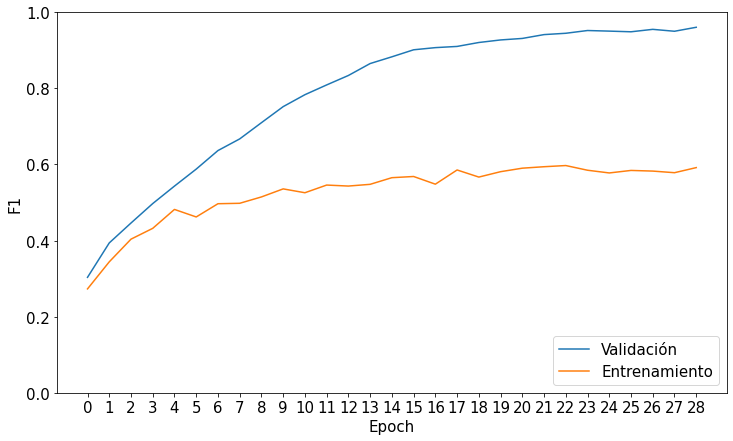

In [ ]:
print_metrics(history)